In [77]:
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import os


In [79]:
def generate_madx_fodo_lattice(num_cells, filename, outputfile, strengths, magnet_lengths, initbetx, initbetay):
    fodo_template = """
TITLE, '{title}';

! Define sequence
FODO_SEQ: sequence, l=16;
    {elements}
endsequence;

! Define beam
BEAM, particle=POSMUON;

! Use sequence
USE, sequence=FODO_SEQ;

! Perform twiss
twiss, file={outfile}, BETX={initbetaxx}, BETY={initbetayy};

STOP;
"""

    length_per_lattice = 16/num_cells
    midway = length_per_lattice / 2
    magnet_center = magnet_lengths / 2

    elements = []
    for i in range(num_cells):
        first_magnet = i * length_per_lattice + magnet_center
        second_magnet = i * length_per_lattice + magnet_center + midway
        elements.append(f"QF{i + 1}: Quadrupole, K1={strengths}, L={magnet_lengths}, AT={first_magnet};")
        elements.append(f"QD{i + 1}: Quadrupole, K1=-{strengths}, L={magnet_lengths}, AT={second_magnet};")

 
    elements_str = "\n    ".join(elements)

    madx_script = fodo_template.format(title=filename, elements=elements_str, outfile=outputfile, strength=strengths, initbetaxx=initbetx, initbetayy=initbetay)

    with open(filename, "w") as file:
        file.write(madx_script)
    
    print(f"MAD-X script generated and saved as {filename}")

# Specify the number of FODO cells


In [152]:
def generate_madx_fodo_matching(num_cells, filename, outputfile, strengths, magnet_lengths, initbetx, initbetay, constraints):
    fodo_template = """
TITLE, '{title}';

! Define sequence
FODO_SEQ: sequence, l=16;
    {elements}
endsequence;

! Define beam
BEAM, particle=POSMUON;

! Use sequence
USE, sequence=FODO_SEQ;

MATCH, sequence=FODO_SEQ,
    BETX={initbetaxx}, BETY={initbetayy};
    {elements_to_vary}
ENDMATCH;

FODO_SEQ_2: SEQUENCE, L=16;
    {new_elements}
ENDSEQUENCE;

USE, SEQUENCE=FODO_SEQ_2;

twiss, file={outfile}, BETX={initbetaxx}, BETY={initbetayy};

STOP;
"""

    length_per_lattice = 16/num_cells
    defocusing = length_per_lattice / 2
    length = (defocusing - magnet_lengths)
    print(f"for length we are getting {length}")
    center = length / 2 
    magnet_center = magnet_lengths / 2

    elements = []
    for i in range(num_cells):
        first_magnet = i * length_per_lattice + magnet_center
        first_drift_center = i * length_per_lattice + magnet_lengths + center
        second_magnet = i * length_per_lattice + magnet_center + defocusing
        second_drift_center = i * length_per_lattice + magnet_lengths + center + defocusing
        elements.append(f"QF{i + 1}: Quadrupole, K1={strengths}, L={magnet_lengths}, AT={first_magnet};")
        elements.append(f"D{i + 1}: DRIFT, L={length}, AT={first_drift_center};")
        elements.append(f"QD{i + 1}: Quadrupole, K1=-{strengths}, L={magnet_lengths}, AT={second_magnet};")
        elements.append(f"D{i + 1}b: DRIFT, L={length}, AT={second_drift_center};")
 
    elements_str = "\n    ".join(elements)

    for_varying = []
    for i in range(num_cells):
        for_varying.append(f"vary, name=QF{i + 1}->K1, step=.00001;")
        for_varying.append(f"vary, name=QD{i + 1}->K1, step=0.00001;")


    for i in range(num_cells):
        for_varying.append(f"constraint, sequence=FODO_SEQ, range=D{i + 1}b, BETX={constraints[i][0]}, BETY={constraints[i][1]};")

    for_varying.append("SIMPLEX, calls=100000, tolerance=1E-10;")

    for i in range(num_cells):
        for_varying.append(f"f_strength{i + 1}:=QF{i + 1}->K1;")
        for_varying.append(f"df_strength{i + 1}:=QD{i + 1}->K1;")

    varying_str = "\n    ".join(for_varying)



    second_run = []
    for i in range(num_cells):
        first_magnet = i * length_per_lattice + magnet_center
        second_magnet = i * length_per_lattice + magnet_center + defocusing
        second_run.append(f"new_QF{i + 1}: Quadrupole, k1=f_strength{i + 1}, L={magnet_lengths}, AT={first_magnet};")
        second_run.append(f"new_QD{i + 1}: Quadrupole, k1=df_strength{i + 1}, L={magnet_lengths}, AT={second_magnet};")

    new_run  = "\n    ".join(second_run)



    madx_script = fodo_template.format(title=filename, elements=elements_str, outfile=outputfile,
                                       strength=strengths, initbetaxx=initbetx, initbetayy=initbetay, elements_to_vary=varying_str, new_elements=new_run)

    with open(filename, "w") as file:
        file.write(madx_script)
    
    print(f"MAD-X script generated and saved as {filename}")

# Specify the number of FODO cells


In [147]:

def plot_twiss_parameters(nameofmadxfile, nameofoutputfile):
    madx_path = '/Users/ryanmichaud/madx_project_2024/madx' 

    subprocess.run([madx_path, nameofmadxfile])


    S=[]
    BETX = []
    BETY = []
    ALPHAX = []
    ALPHAY = []
    data = []
    data = []
    with open(nameofoutputfile) as f:
        for line in f:
            if line.startswith('@') or line.startswith('*') or line.startswith('$'):
                continue
            values = line.split()
            S.append(float(values[2]))
            BETX.append(float(values[3]))
            BETY.append(float(values[6]))
            ALPHAX.append(float(values[4]))
            ALPHAY.append(float(values[7]))

    # Plot BETX and BETY
    plt.figure(figsize=(12, 8))
    plt.plot(S, BETX, label='BETX')
    plt.plot(S, BETY, label='BETY')
    plt.xlabel('Position S (m)')
    plt.ylabel('Beta (m)')
    plt.title('Beta Functions vs. Position')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot ALPHAX and ALPHAY
    plt.figure(figsize=(12, 8))
    plt.plot(S, ALPHAX, label='ALPHAX')
    plt.plot(S, ALPHAY, label='ALPHAY')
    plt.xlabel('Position S (m)')
    plt.ylabel('Alpha')
    plt.title('Alpha Functions vs. Position')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
outputfilename = 'testing.tfs'
madxfilename = "trial3.madx"
num_fodo_cells = 3
magnet_strengths = 18
length_of_magnets = 0.25
initial_beta_x= 0.03
initial_beta_y = 0.02
constraints = [(0.03, 0.02), (0.03, 0.02), (0.03, 0.02)]

generate_madx_fodo_matching(num_fodo_cells, madxfilename, outputfilename, magnet_strengths, length_of_magnets, initial_beta_x, initial_beta_y, constraints)
plot_twiss_parameters(madxfilename, outputfilename)


2
for length we are getting 0.25
MAD-X script generated and saved as test2.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:28:06      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test2.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=2, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-2, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=2, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-2, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=2, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-2, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=2, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


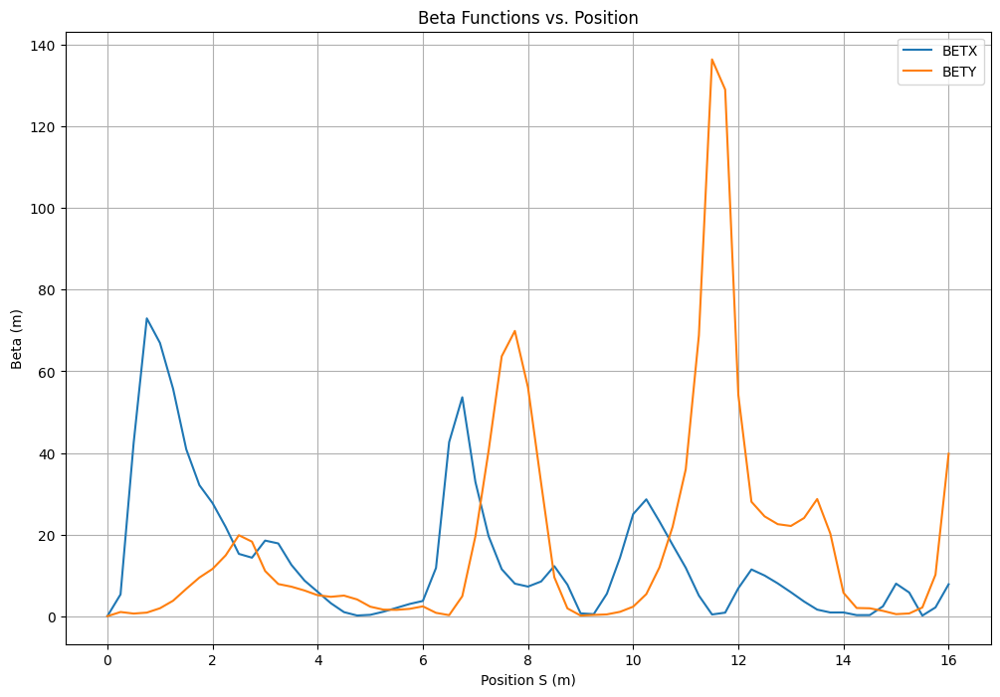

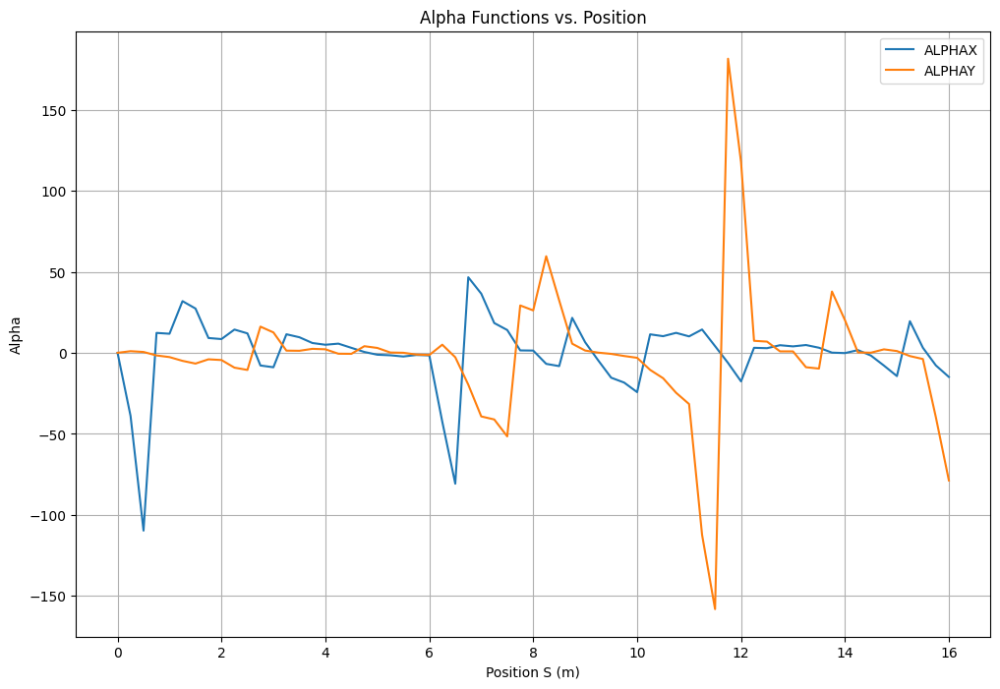

3
for length we are getting 0.25
MAD-X script generated and saved as test3.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:28:31      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test3.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=3, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-3, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=3, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-3, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=3, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-3, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=3, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


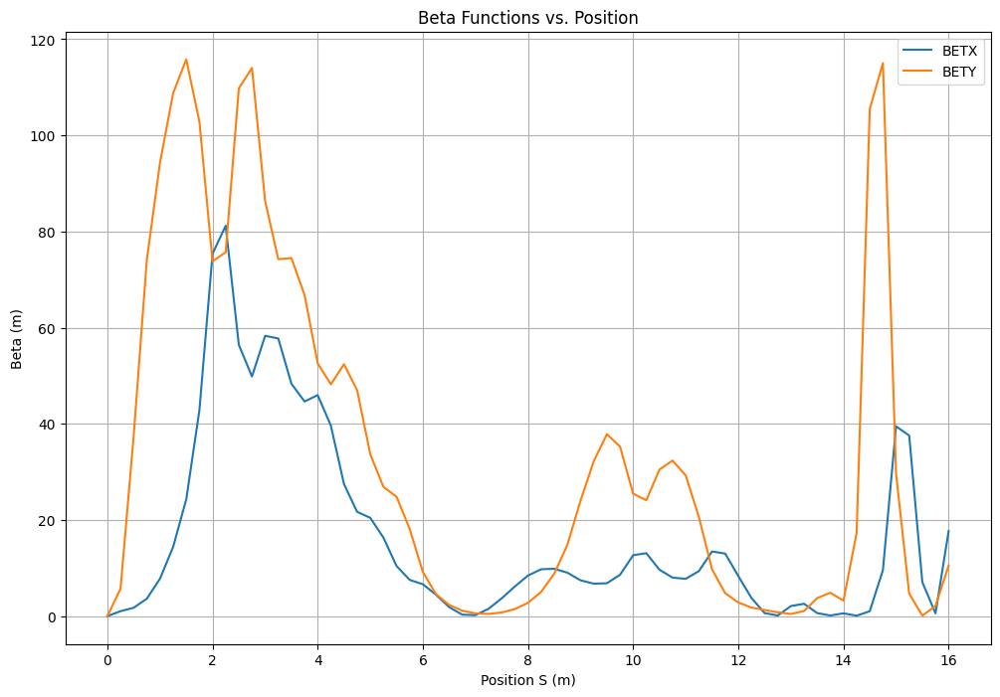

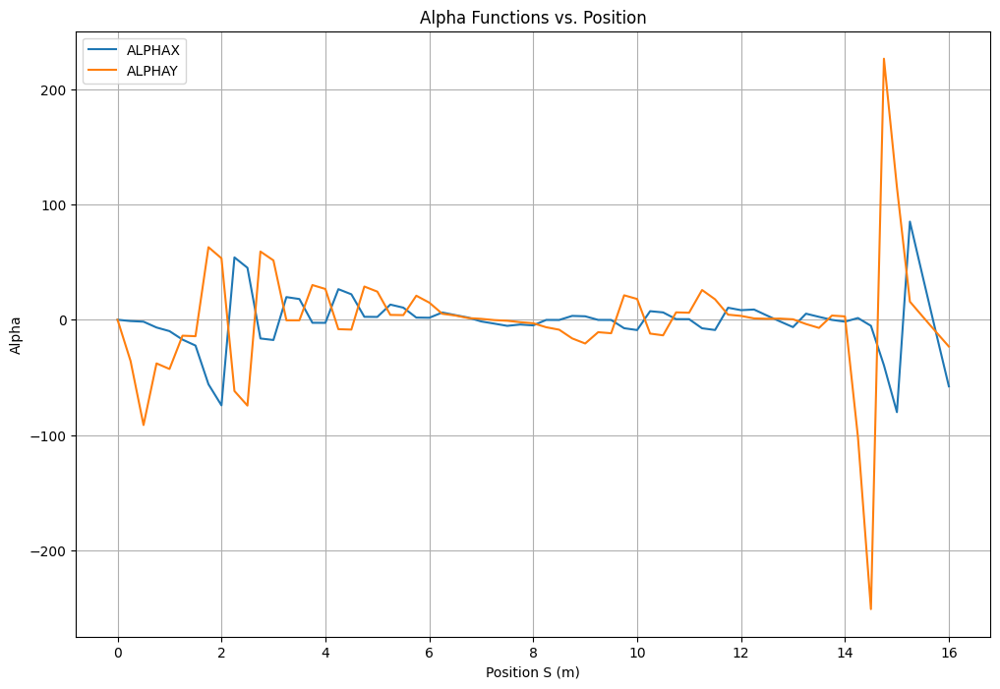

4
for length we are getting 0.25
MAD-X script generated and saved as test4.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:28:57      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test4.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=4, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-4, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=4, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-4, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=4, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-4, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=4, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


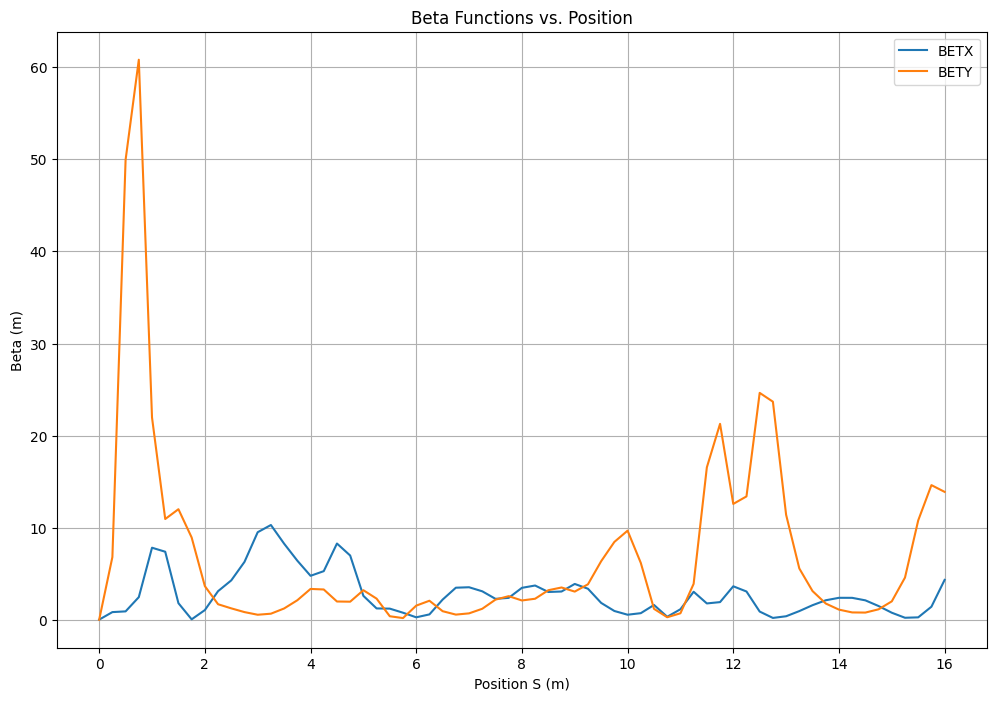

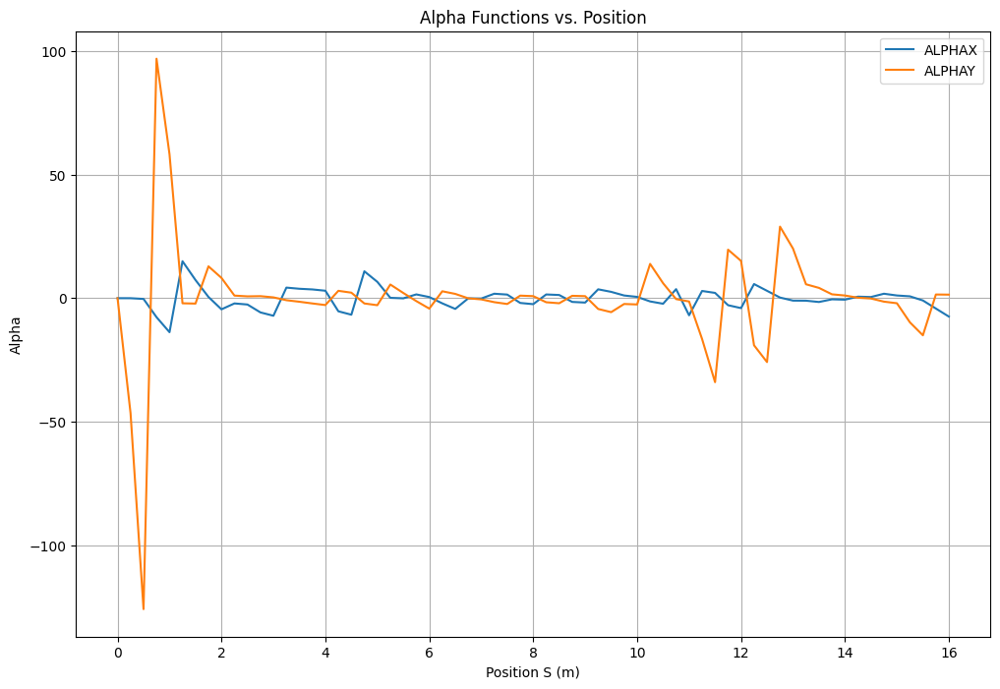

5
for length we are getting 0.25
MAD-X script generated and saved as test5.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:29:23      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test5.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=5, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-5, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=5, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-5, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=5, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-5, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=5, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


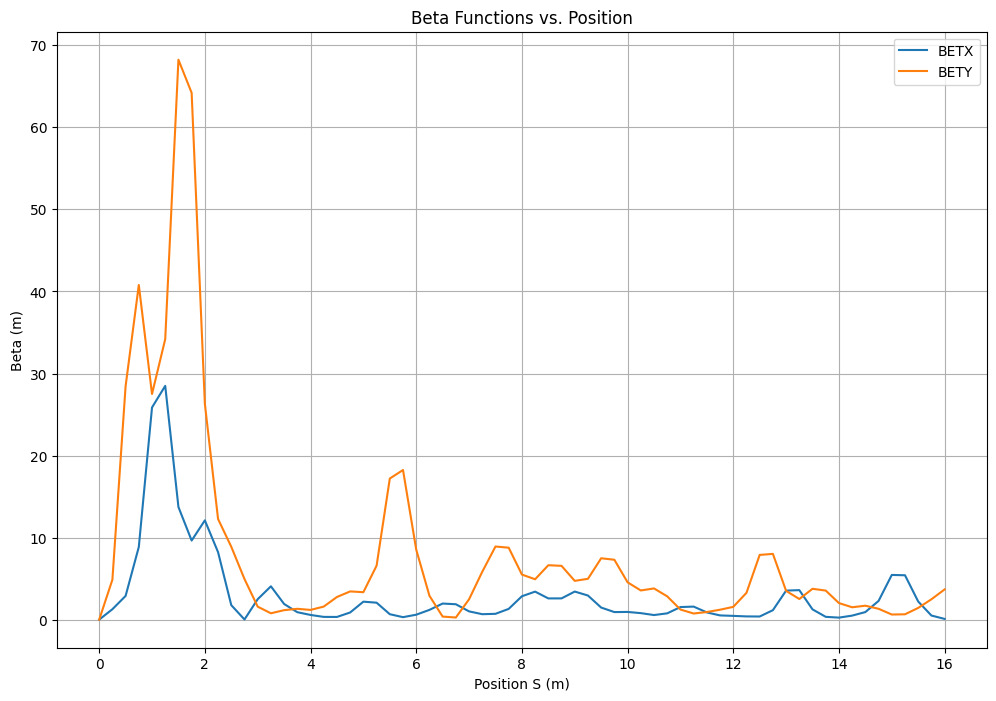

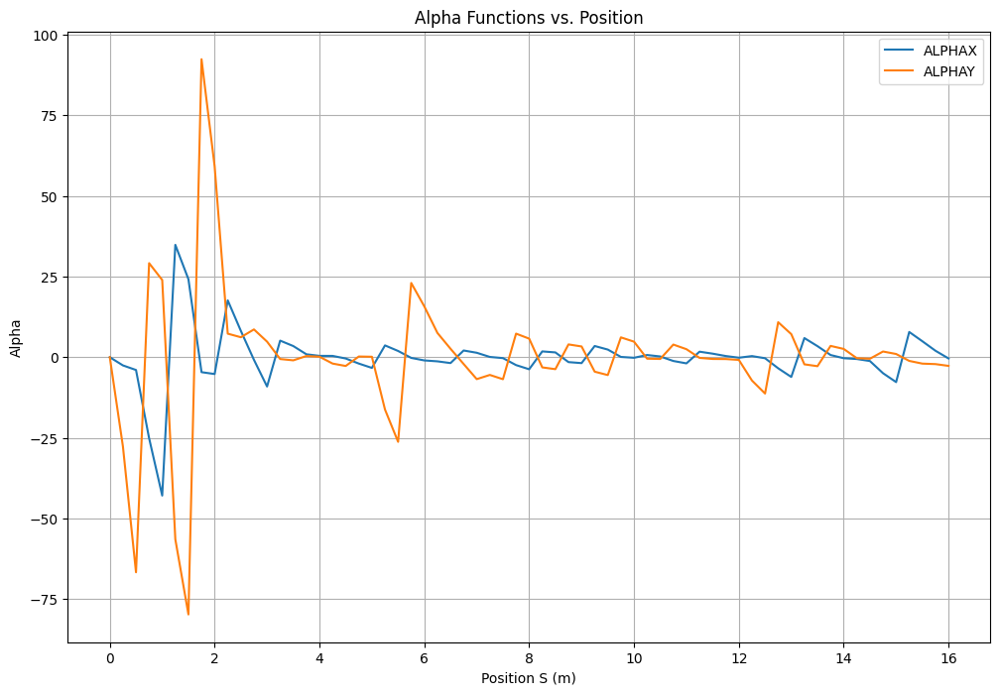

6
for length we are getting 0.25
MAD-X script generated and saved as test6.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:29:49      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test6.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=6, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-6, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=6, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-6, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=6, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-6, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=6, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


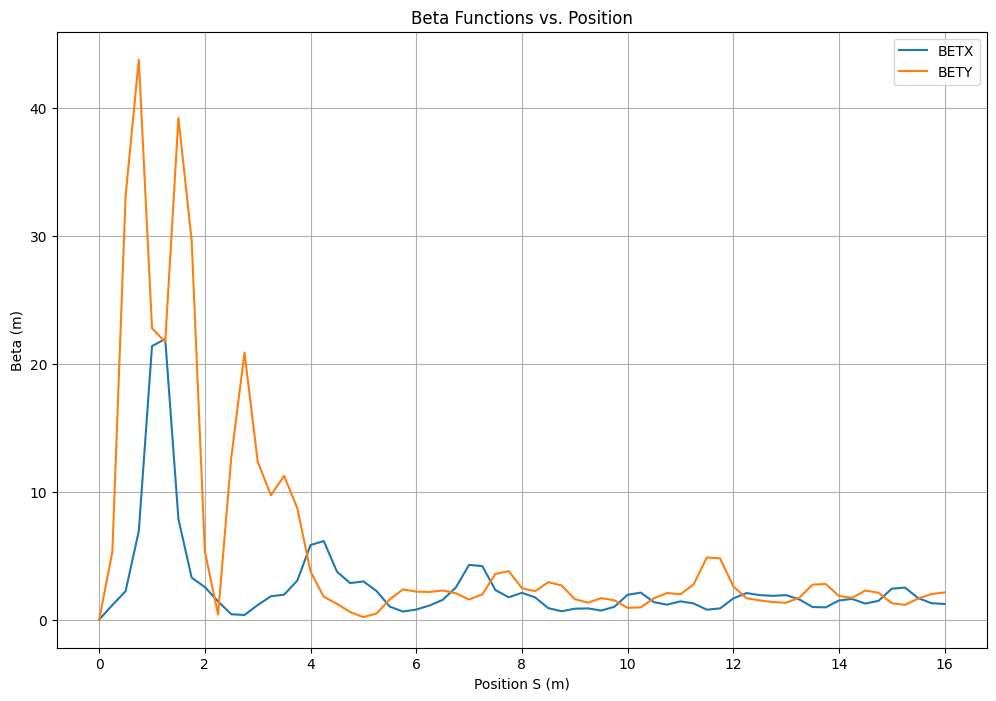

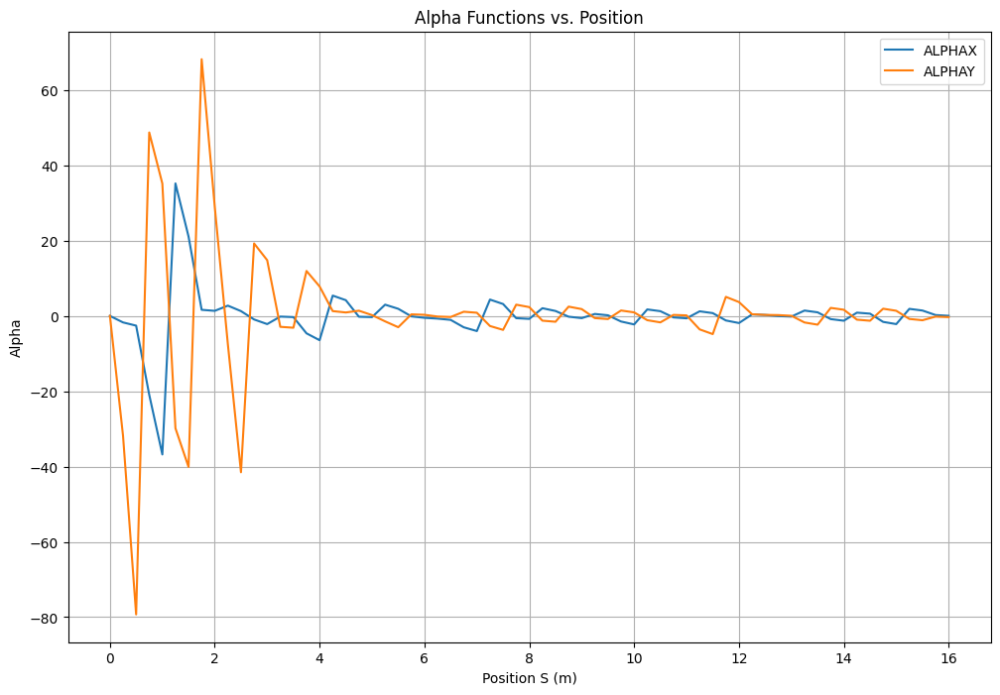

7
for length we are getting 0.25
MAD-X script generated and saved as test7.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:30:15      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test7.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=7, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-7, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=7, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-7, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=7, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-7, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=7, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


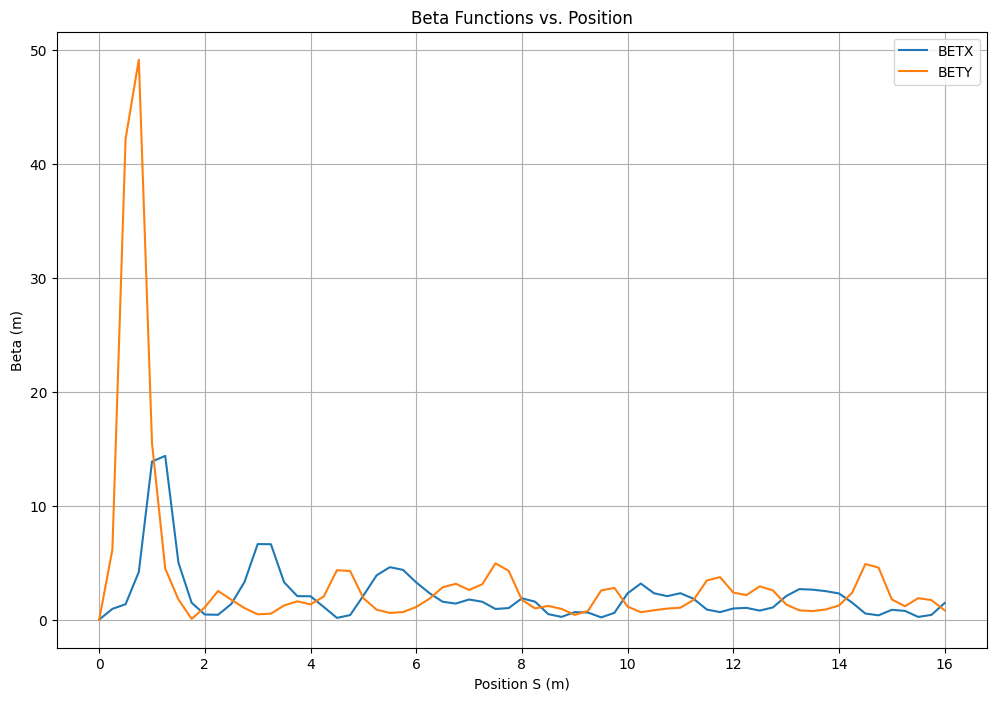

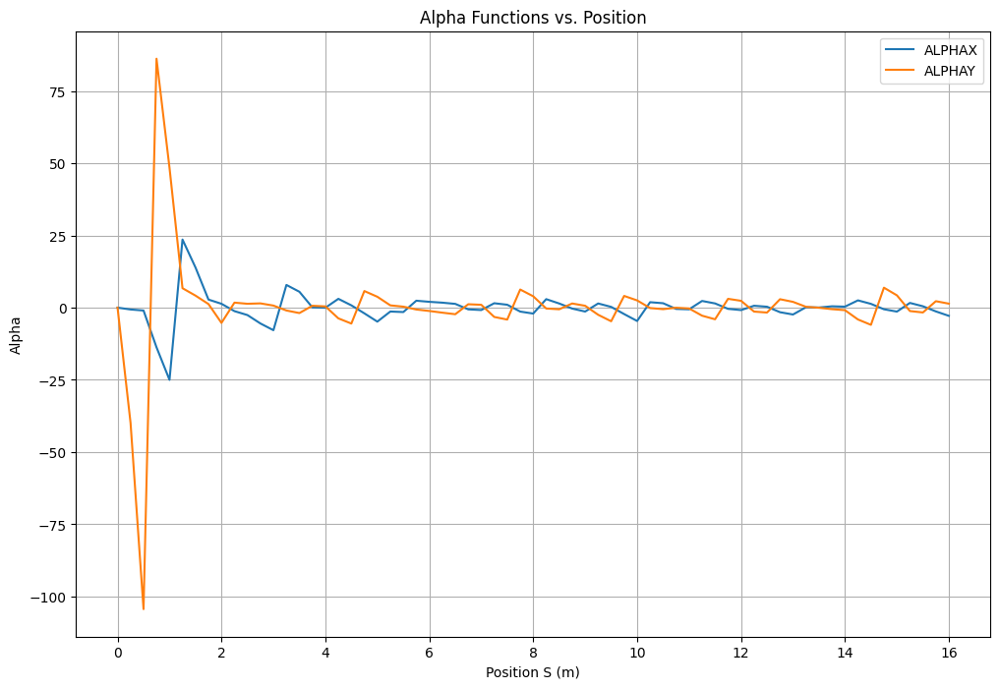

8
for length we are getting 0.25
MAD-X script generated and saved as test8.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:30:42      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test8.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=8, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-8, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=8, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-8, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=8, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-8, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=8, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


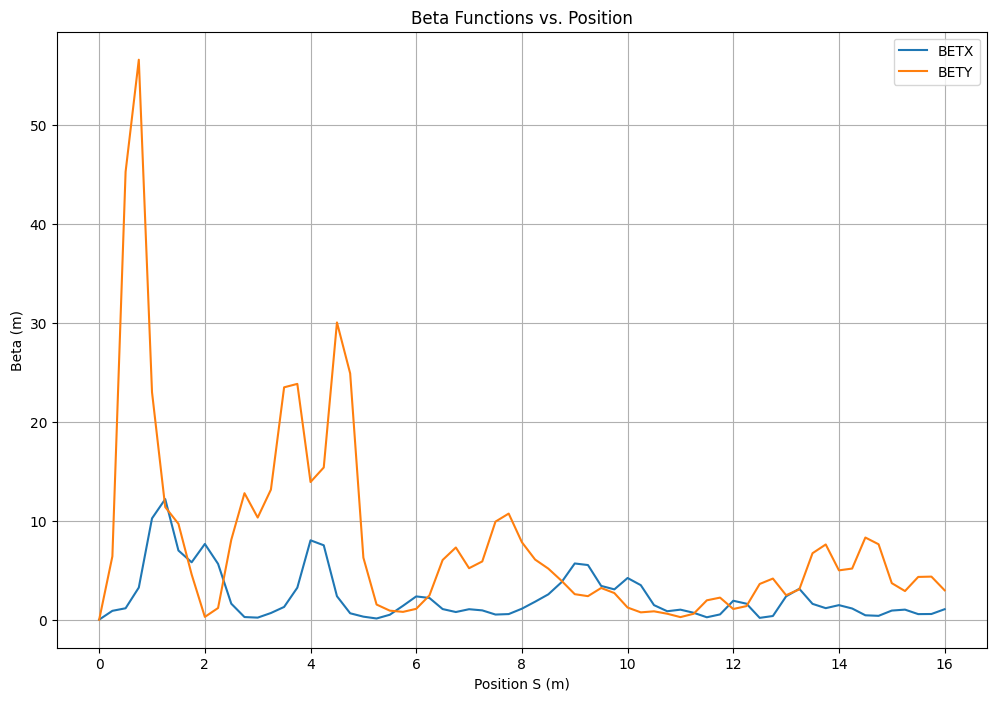

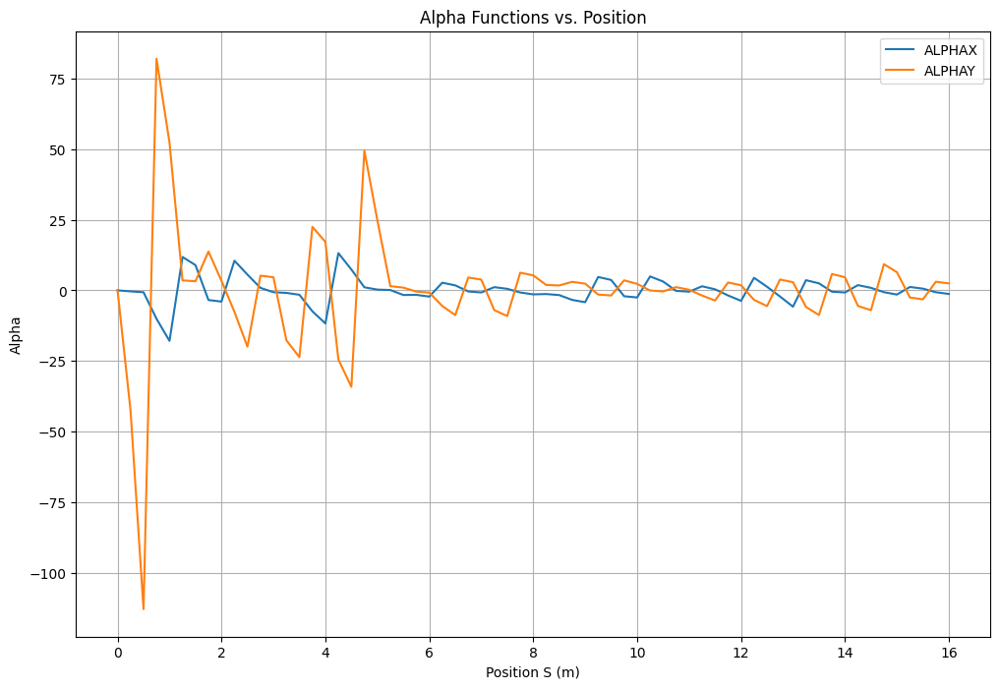

9
for length we are getting 0.25
MAD-X script generated and saved as test9.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:31:08      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test9.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=9, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-9, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=9, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-9, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=9, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-9, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=9, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, AT=3.375;


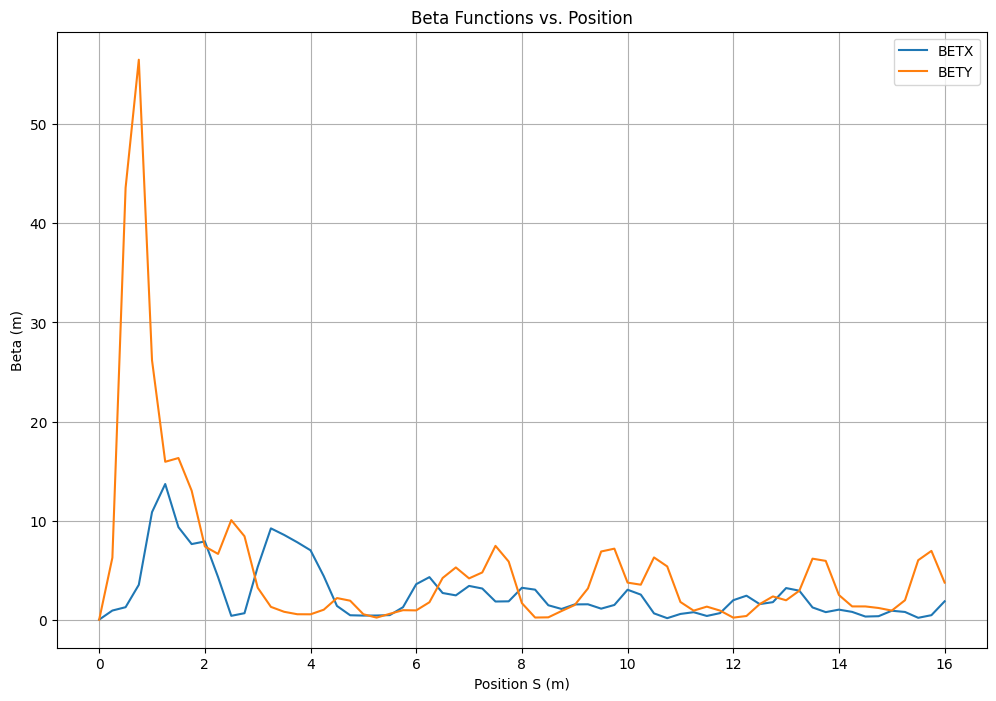

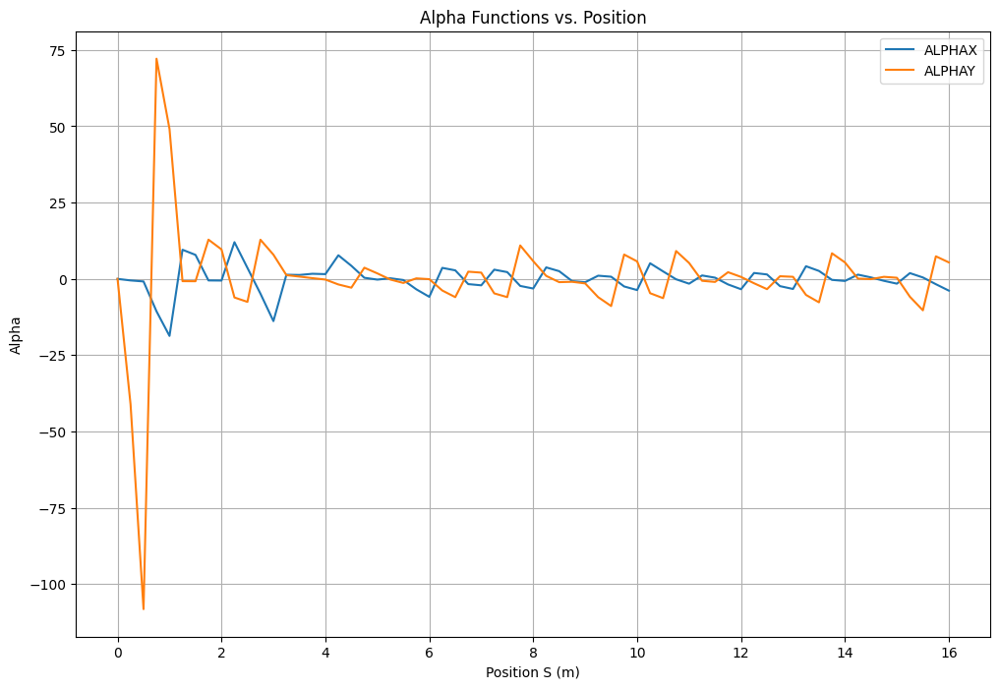

10
for length we are getting 0.25
MAD-X script generated and saved as test10.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:31:35      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test10.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=10, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-10, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=10, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-10, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=10, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-10, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=10, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

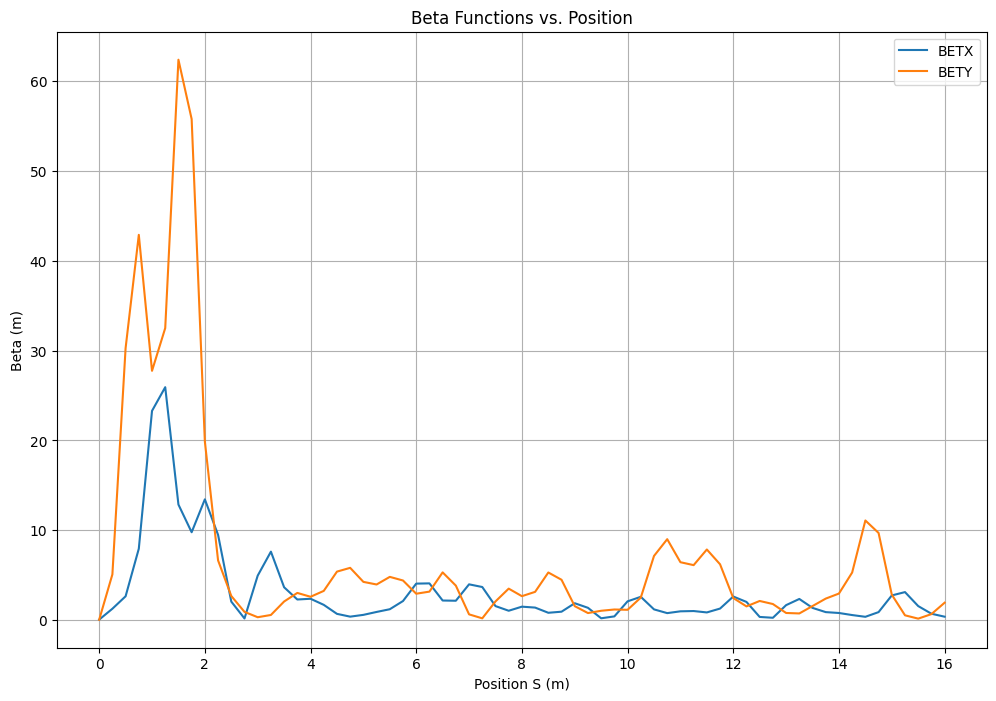

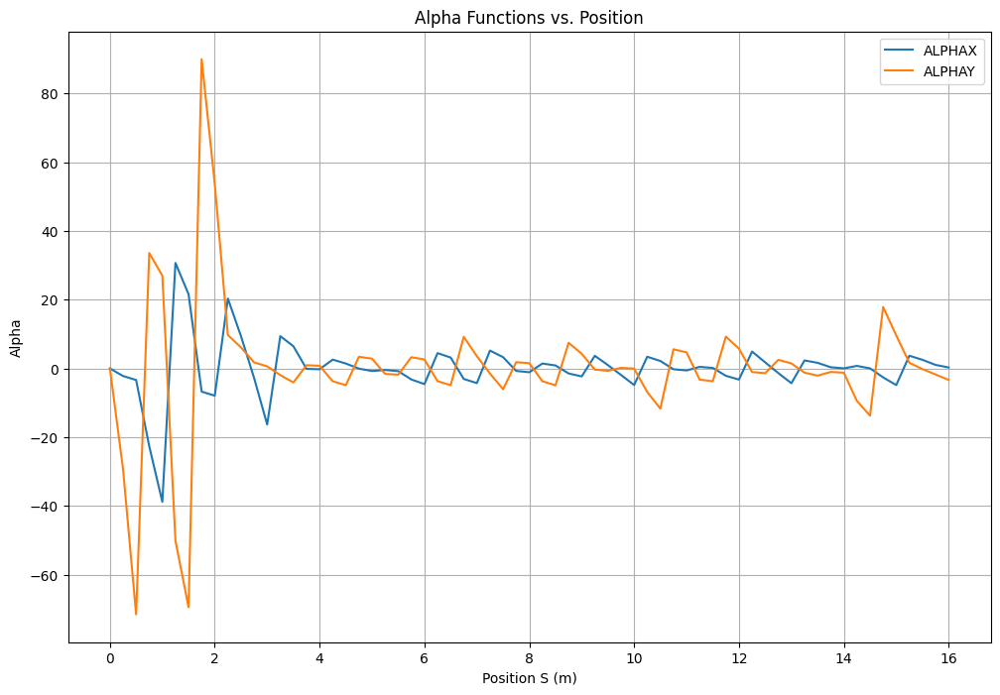

11
for length we are getting 0.25
MAD-X script generated and saved as test11.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:32:02      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test11.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=11, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-11, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=11, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-11, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=11, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-11, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=11, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

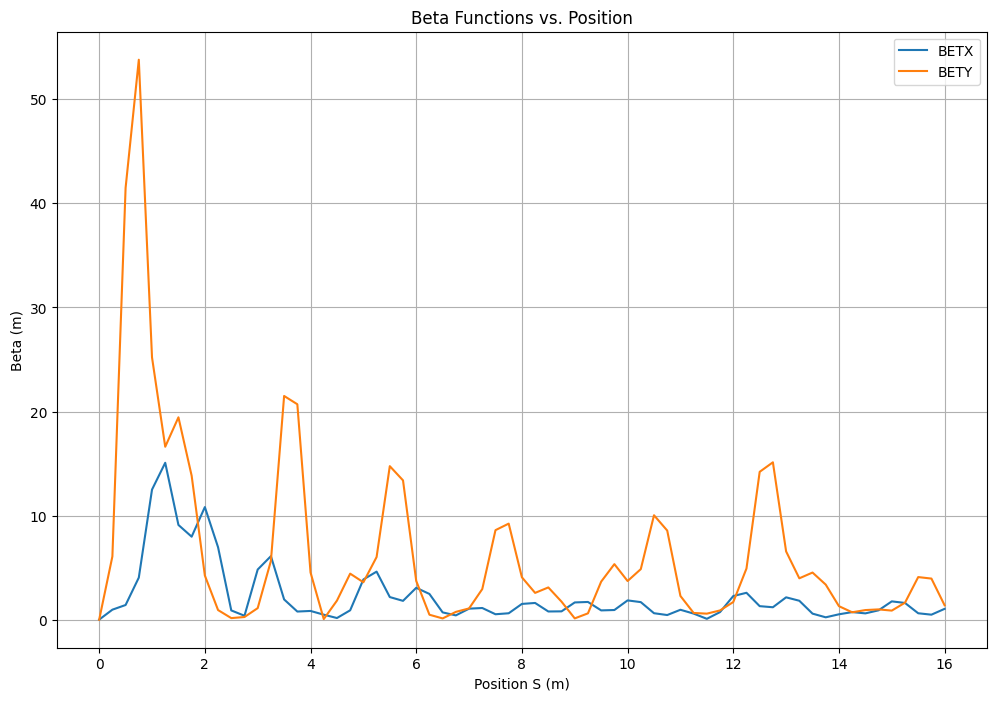

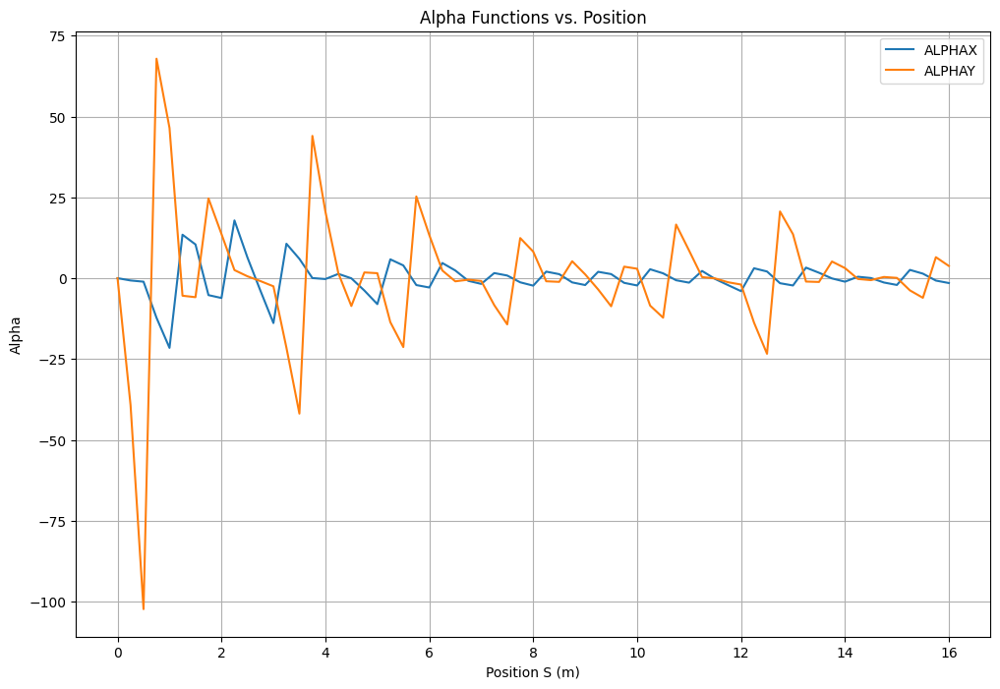

12
for length we are getting 0.25
MAD-X script generated and saved as test12.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:32:28      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test12.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=12, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-12, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=12, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-12, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=12, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-12, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=12, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

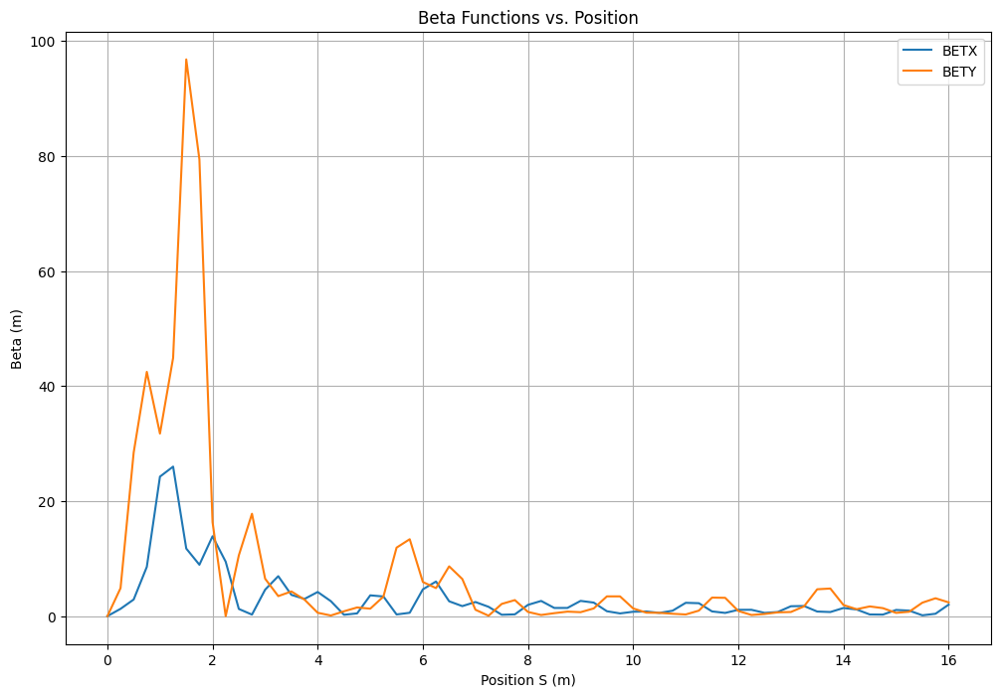

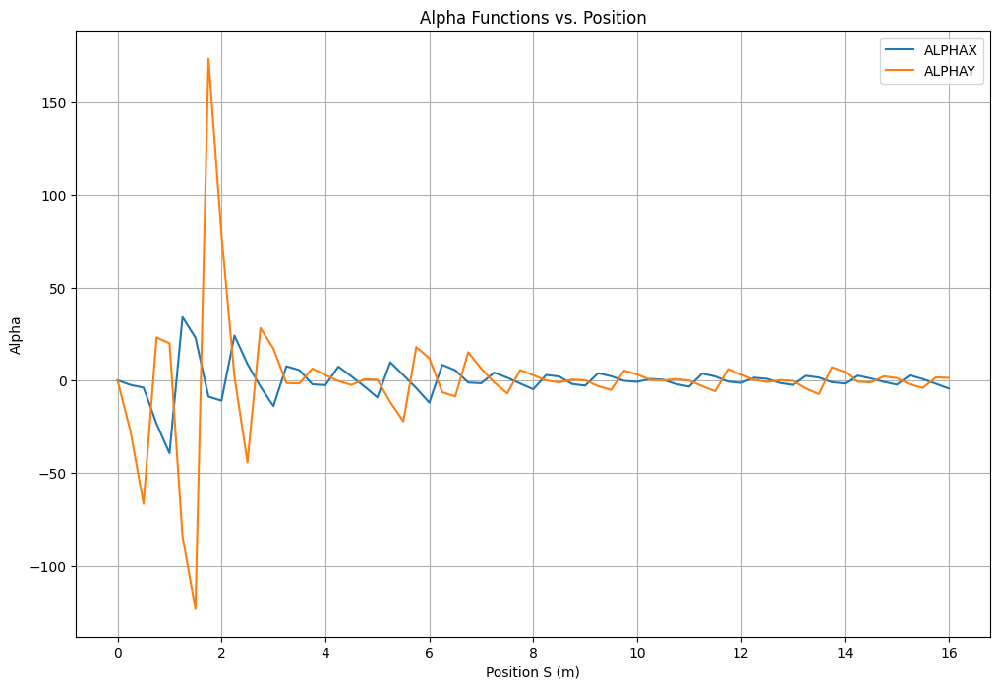

13
for length we are getting 0.25
MAD-X script generated and saved as test13.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:32:54      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test13.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=13, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-13, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=13, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-13, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=13, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-13, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=13, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

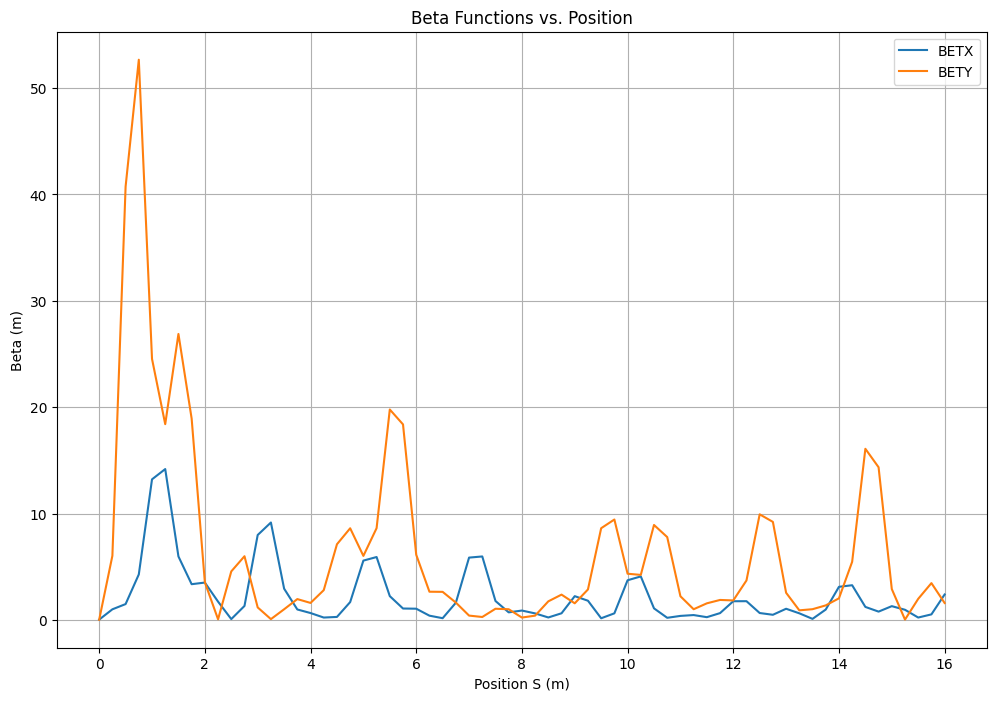

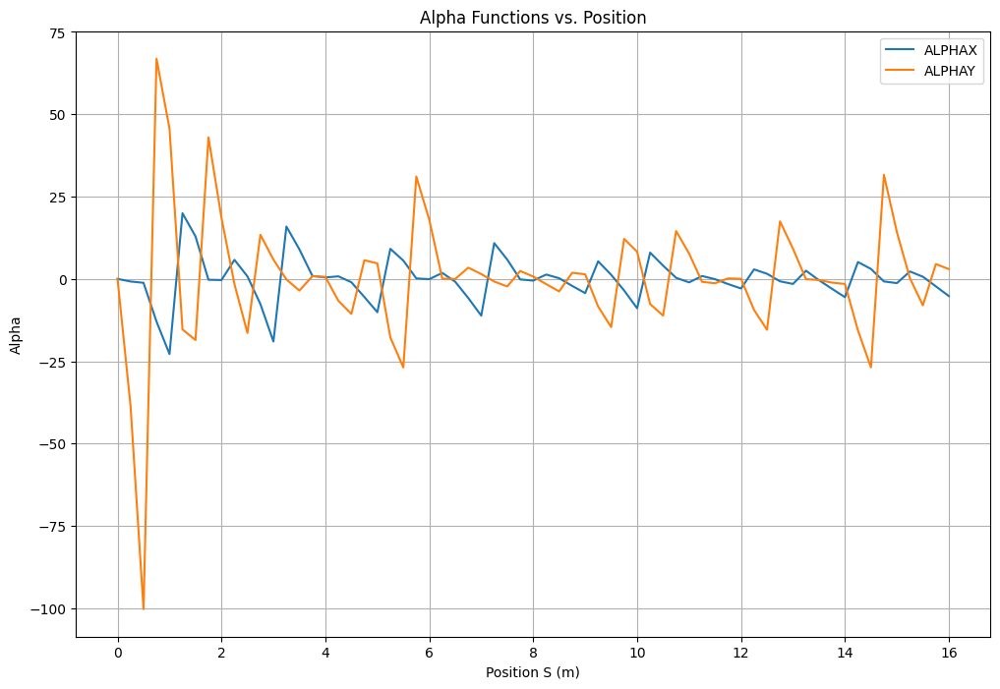

14
for length we are getting 0.25
MAD-X script generated and saved as test14.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:33:20      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test14.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=14, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-14, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=14, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-14, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=14, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-14, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=14, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

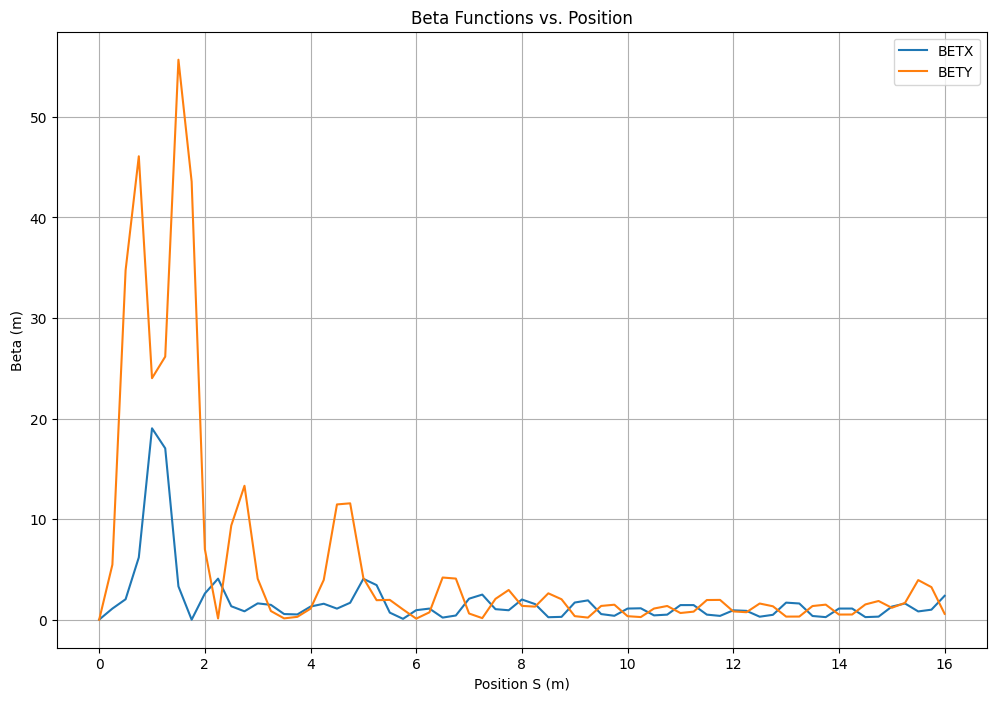

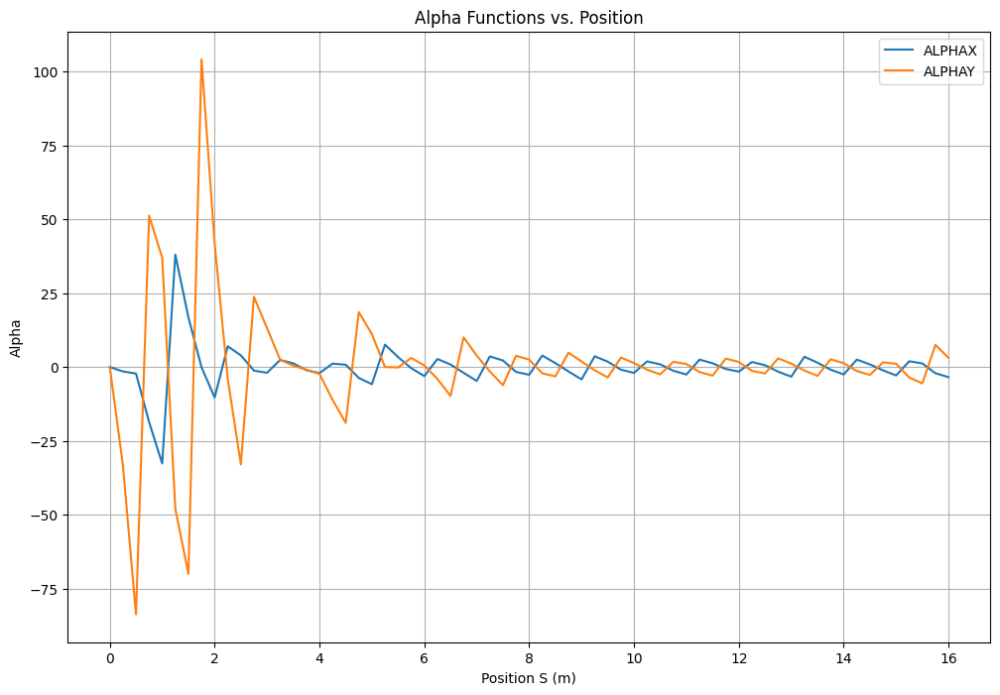

15
for length we are getting 0.25
MAD-X script generated and saved as test15.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:33:47      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test15.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=15, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-15, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=15, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-15, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=15, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-15, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=15, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

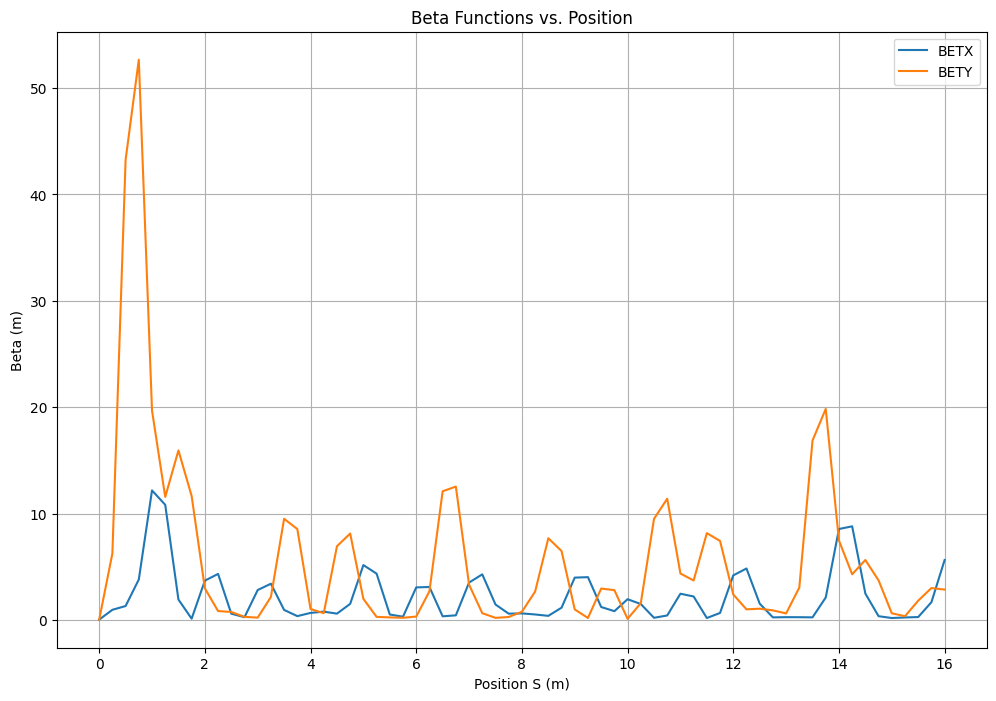

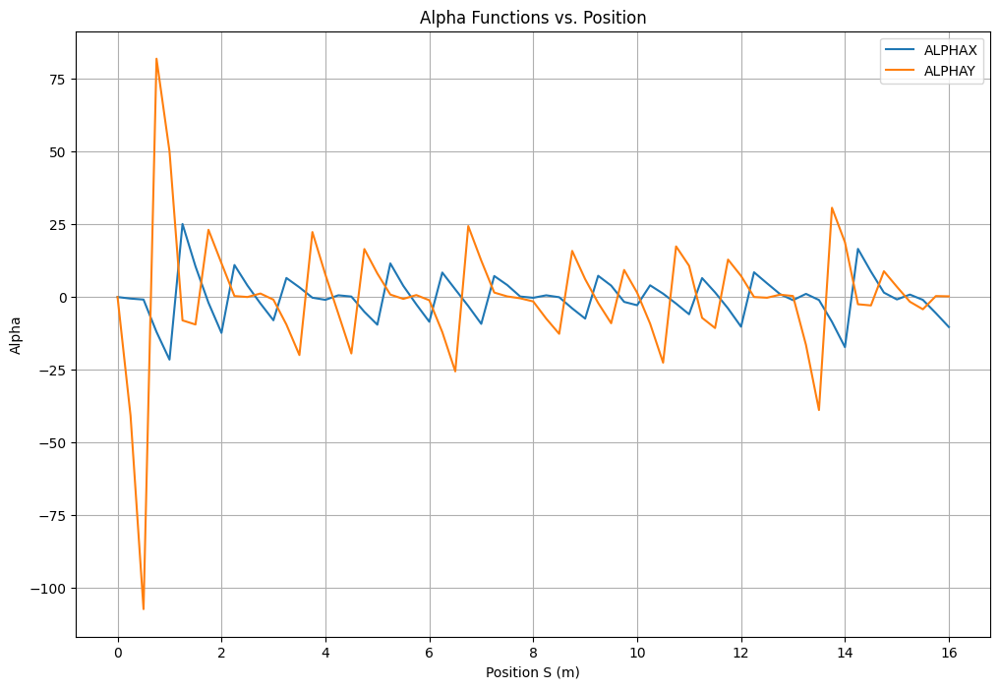

16
for length we are getting 0.25
MAD-X script generated and saved as test16.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:34:12      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test16.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=16, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-16, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=16, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-16, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=16, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-16, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=16, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

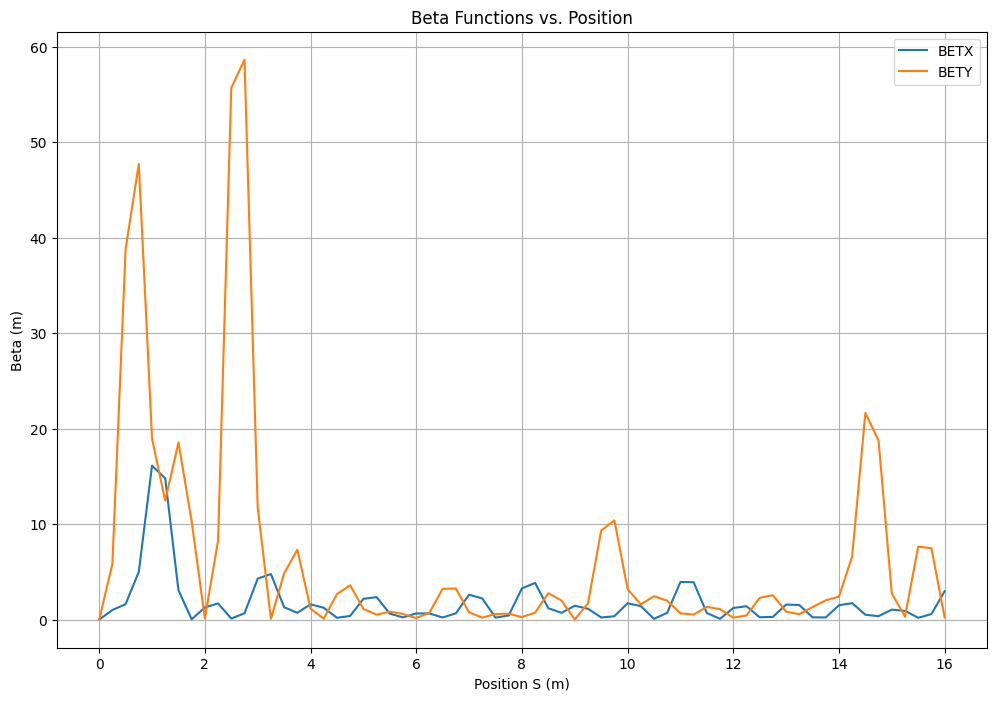

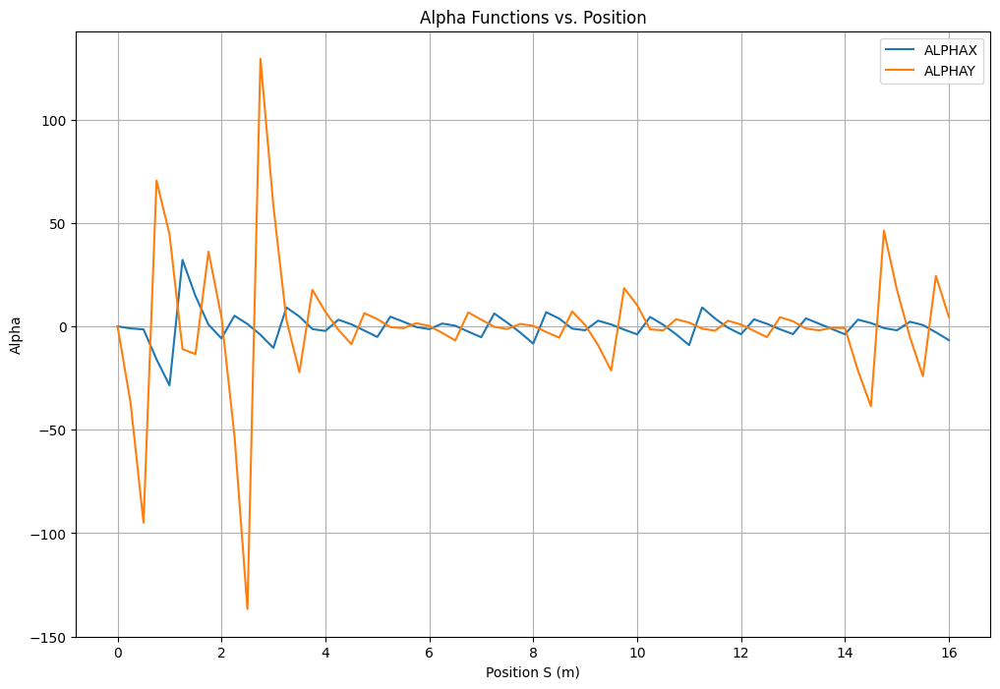

17
for length we are getting 0.25
MAD-X script generated and saved as test17.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:34:39      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test17.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=17, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-17, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=17, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-17, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=17, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-17, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=17, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

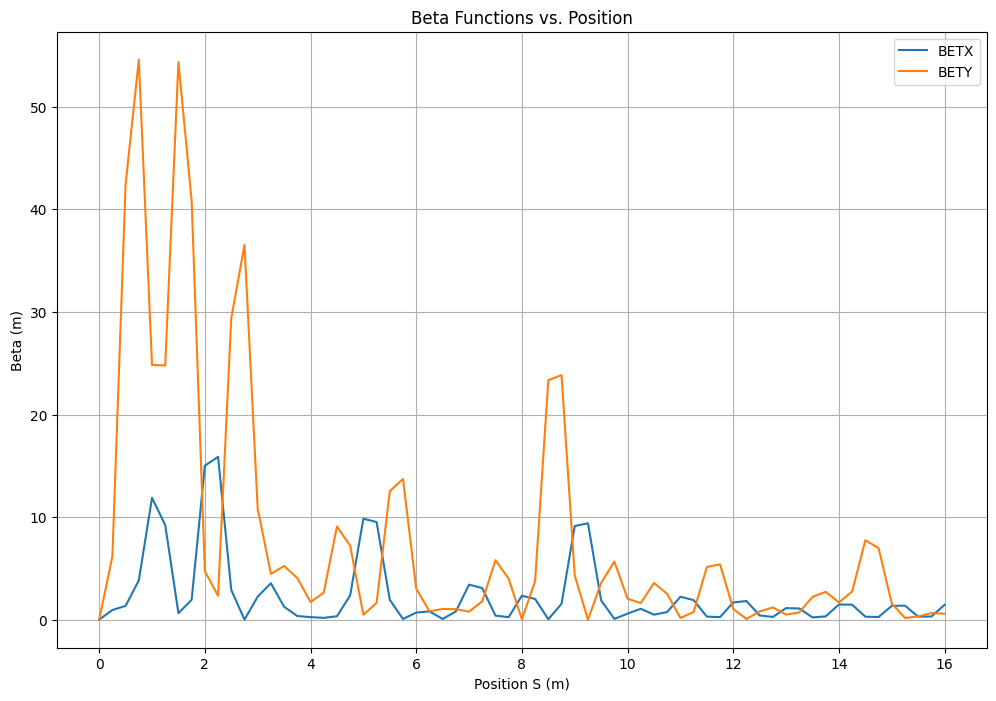

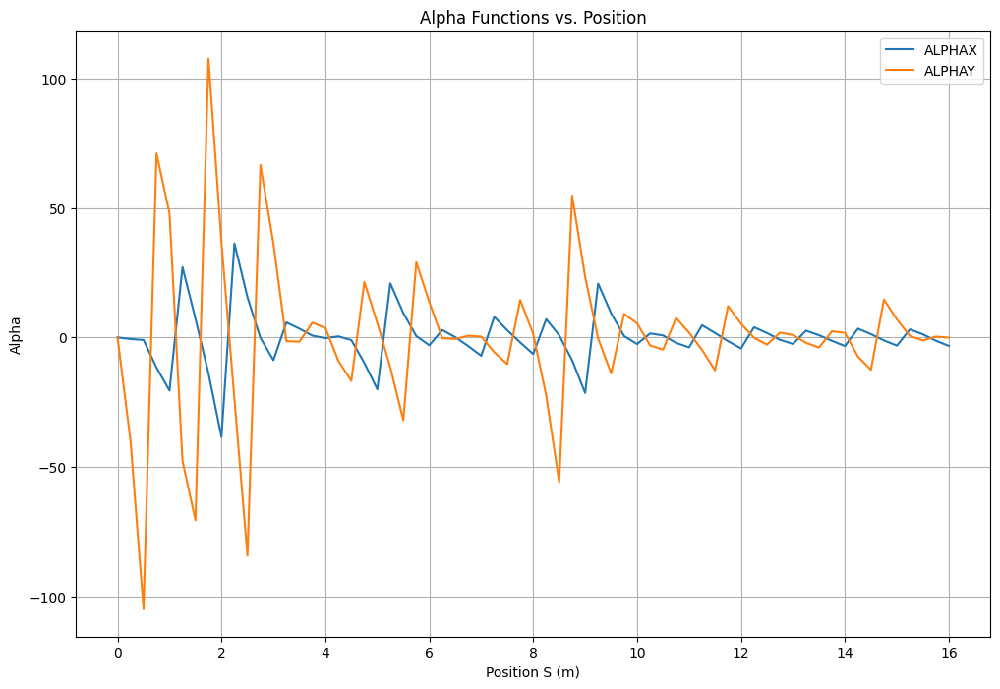

18
for length we are getting 0.25
MAD-X script generated and saved as test18.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:35:05      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test18.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=18, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-18, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=18, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-18, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=18, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-18, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=18, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

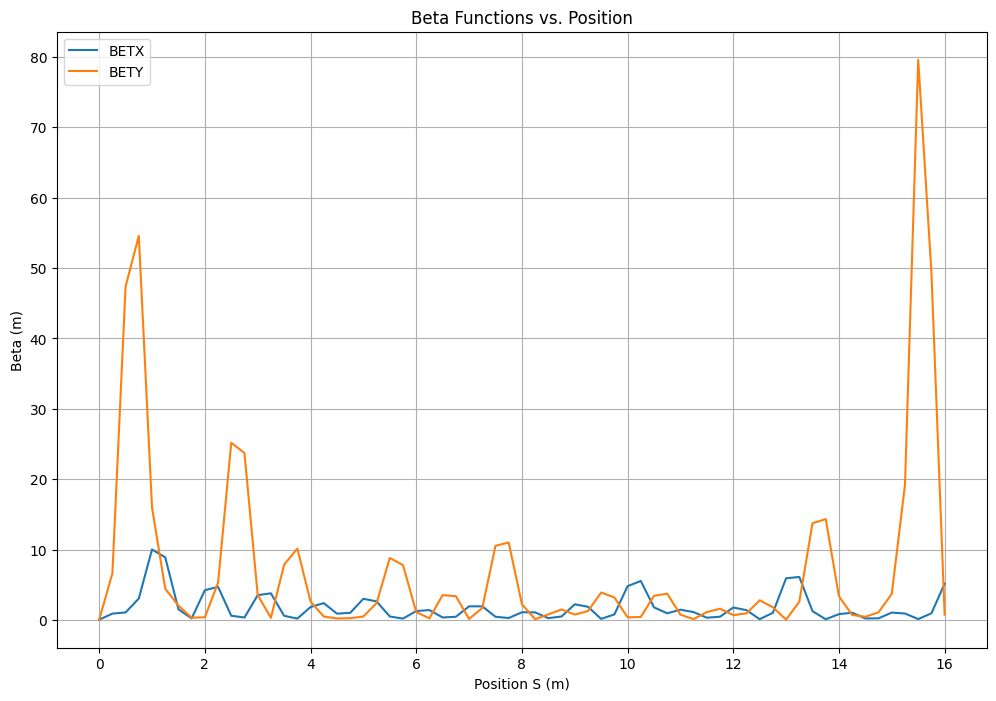

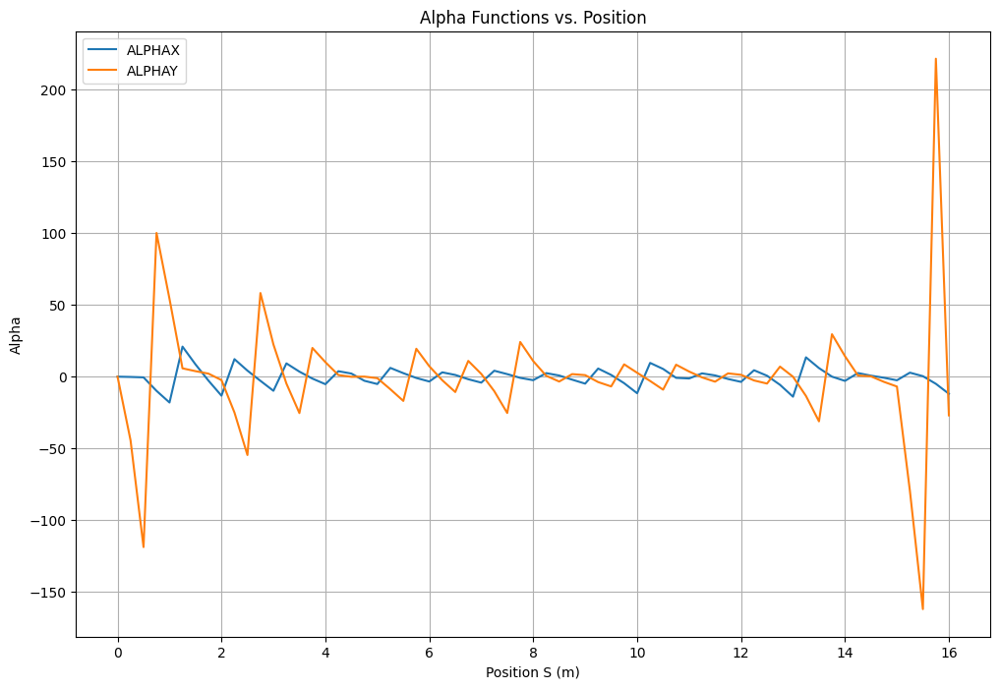

19
for length we are getting 0.25
MAD-X script generated and saved as test19.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:35:31      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test19.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=19, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-19, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=19, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-19, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=19, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-19, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=19, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

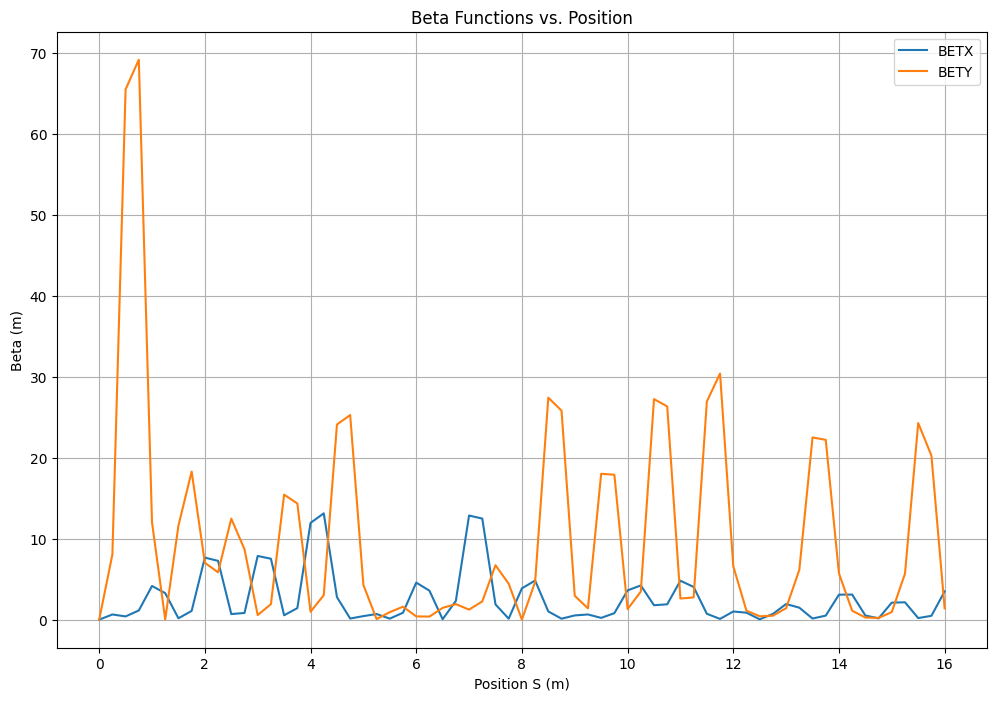

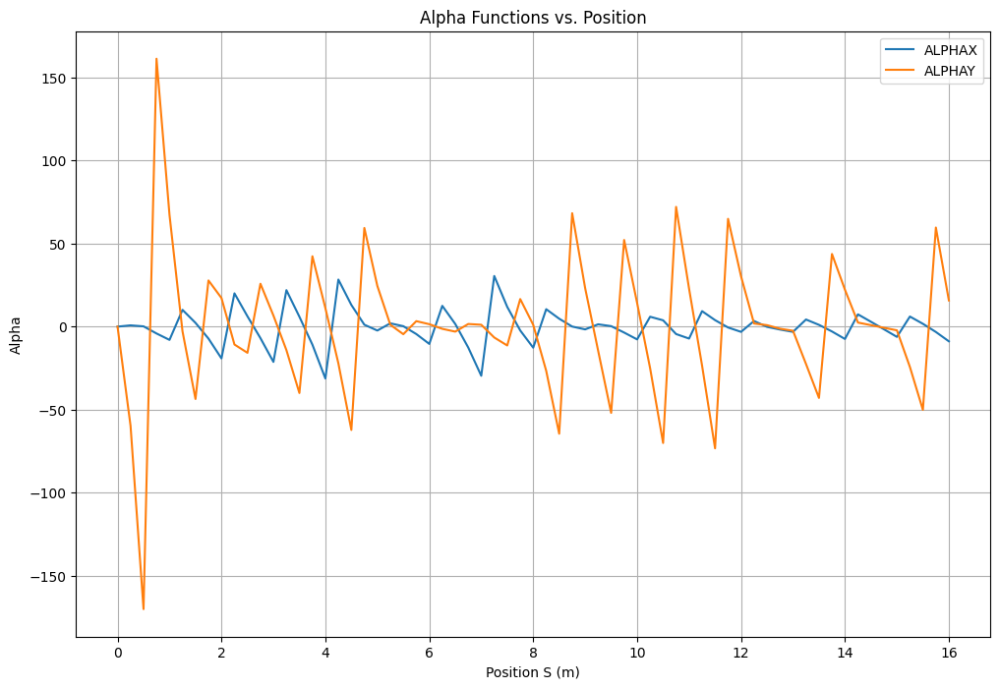

20
for length we are getting 0.25
MAD-X script generated and saved as test20.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:35:57      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test20.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=20, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-20, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=20, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-20, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=20, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-20, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=20, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

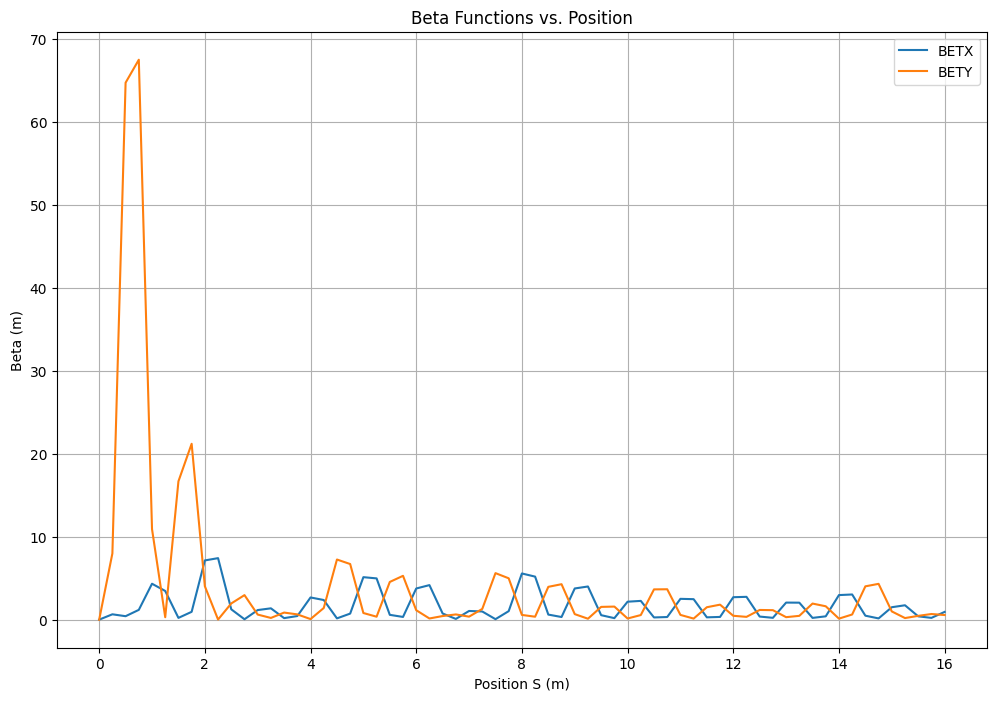

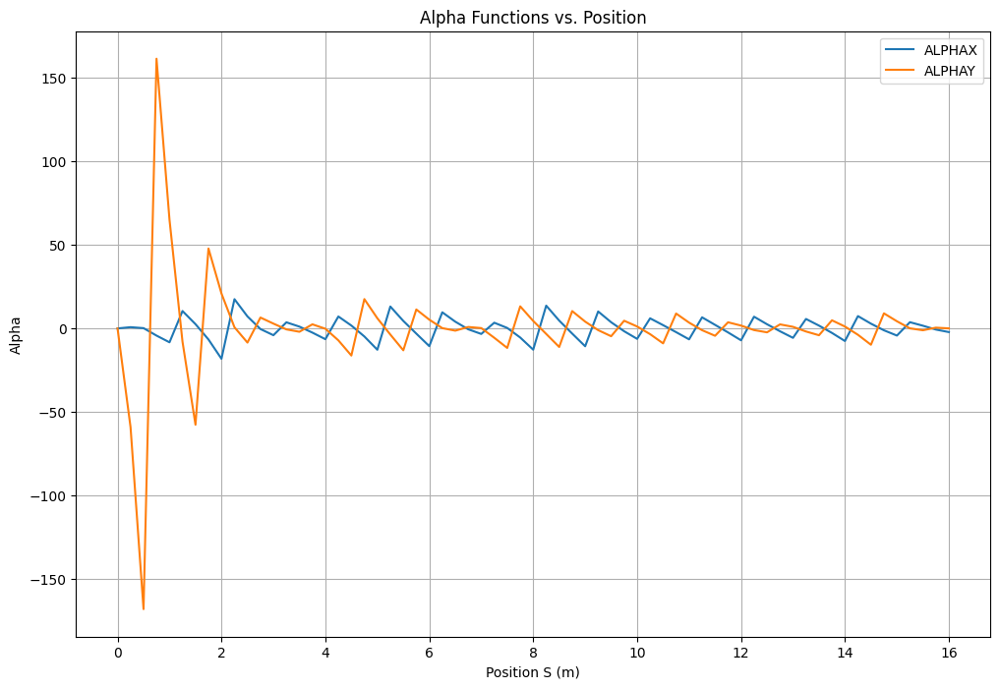

21
for length we are getting 0.25
MAD-X script generated and saved as test21.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:36:23      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test21.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=21, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-21, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=21, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-21, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=21, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-21, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=21, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

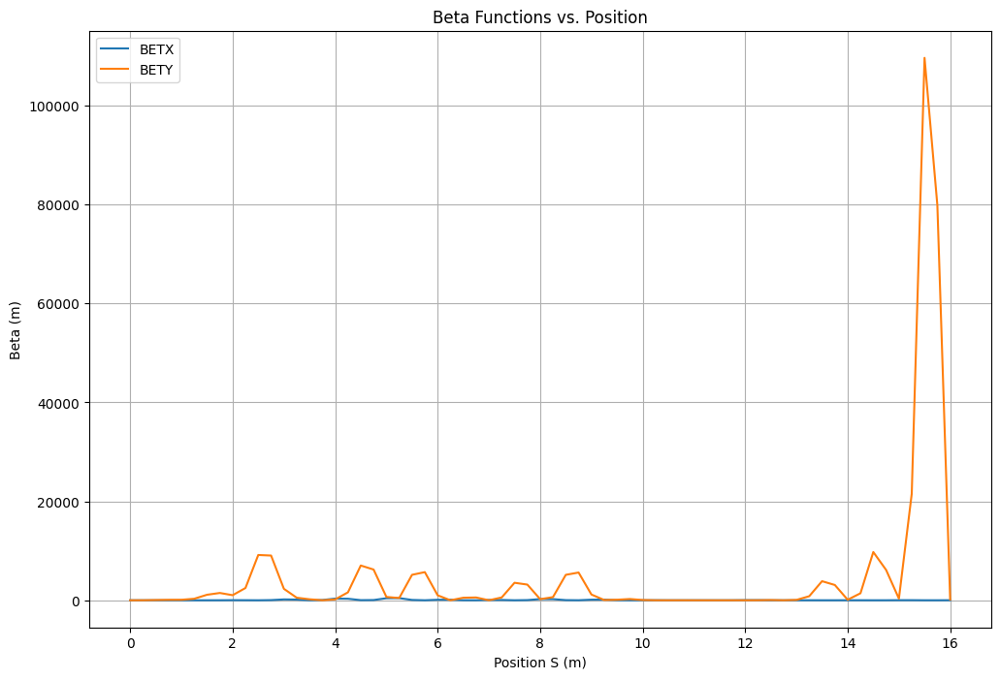

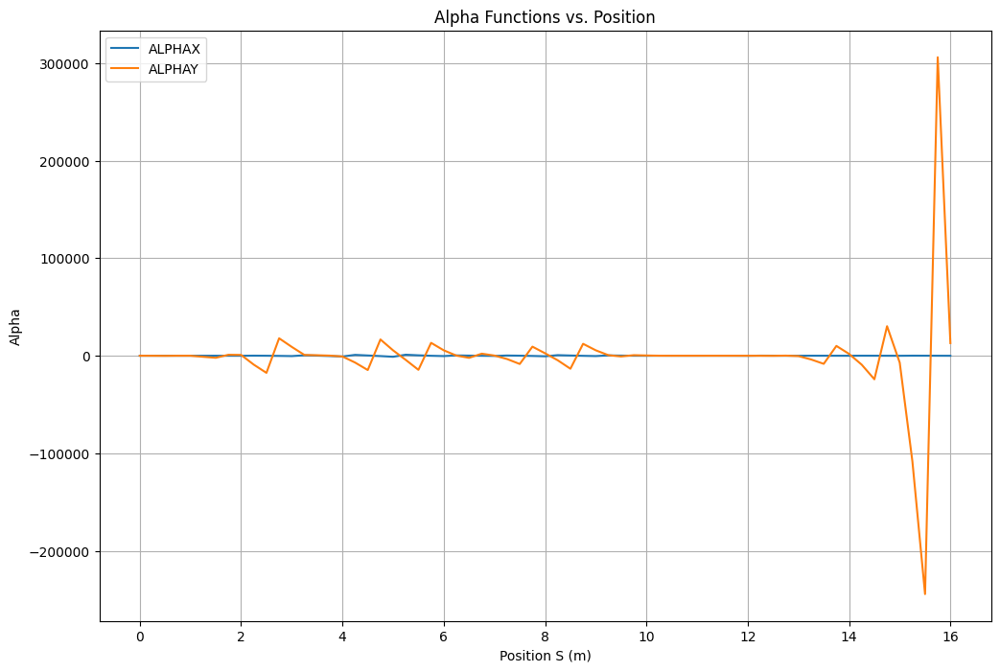

22
for length we are getting 0.25
MAD-X script generated and saved as test22.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:36:49      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test22.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=22, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-22, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=22, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-22, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=22, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-22, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=22, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

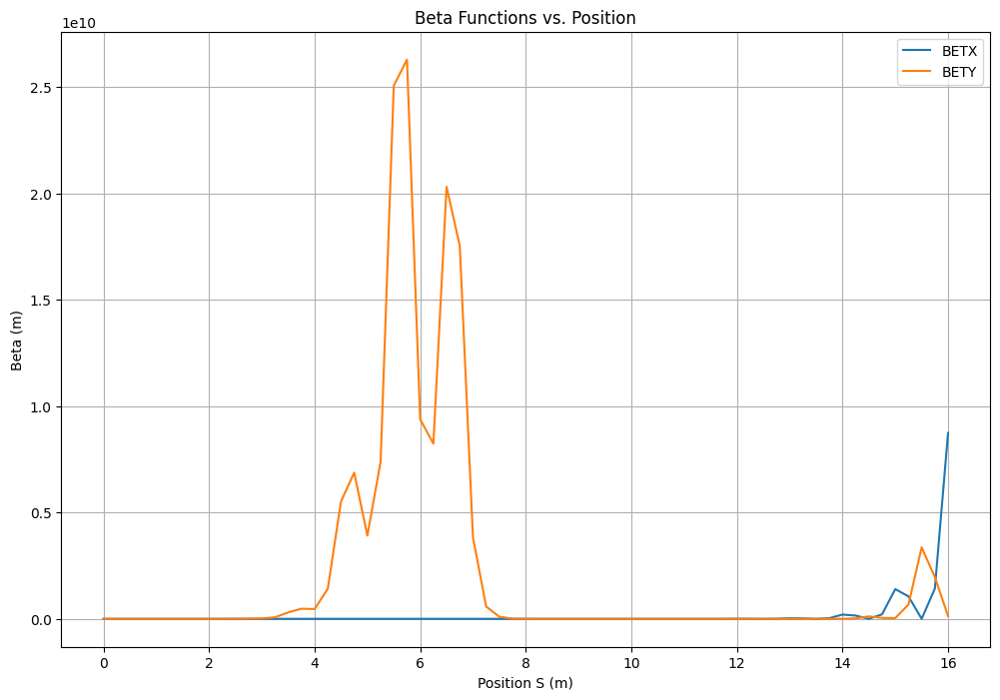

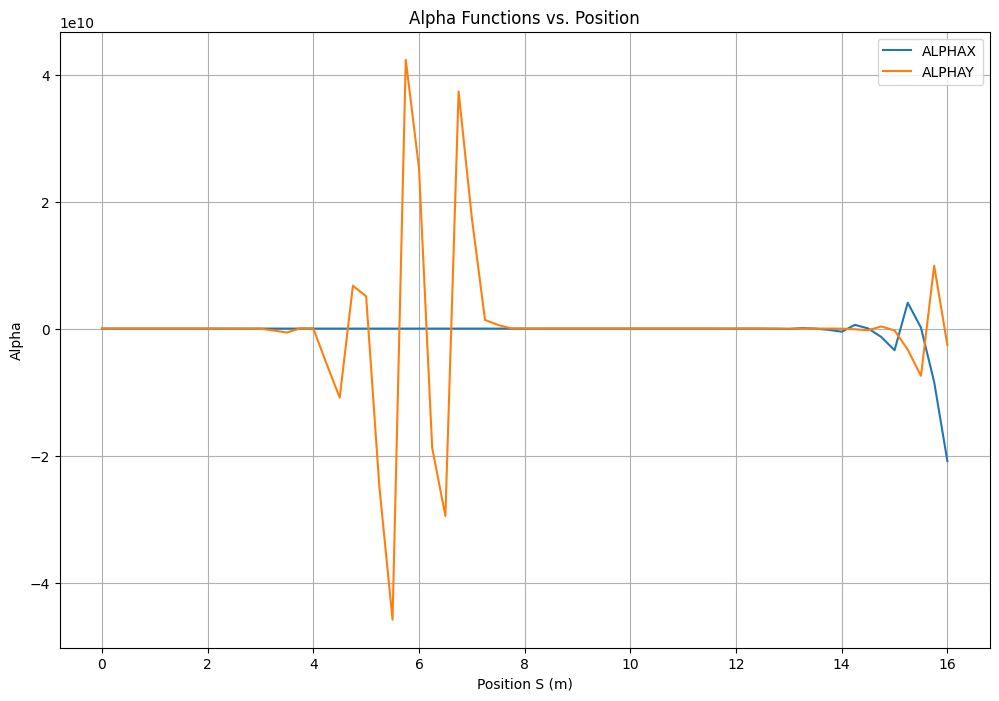

23
for length we are getting 0.25
MAD-X script generated and saved as test23.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:37:15      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test23.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=23, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-23, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=23, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-23, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=23, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-23, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=23, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

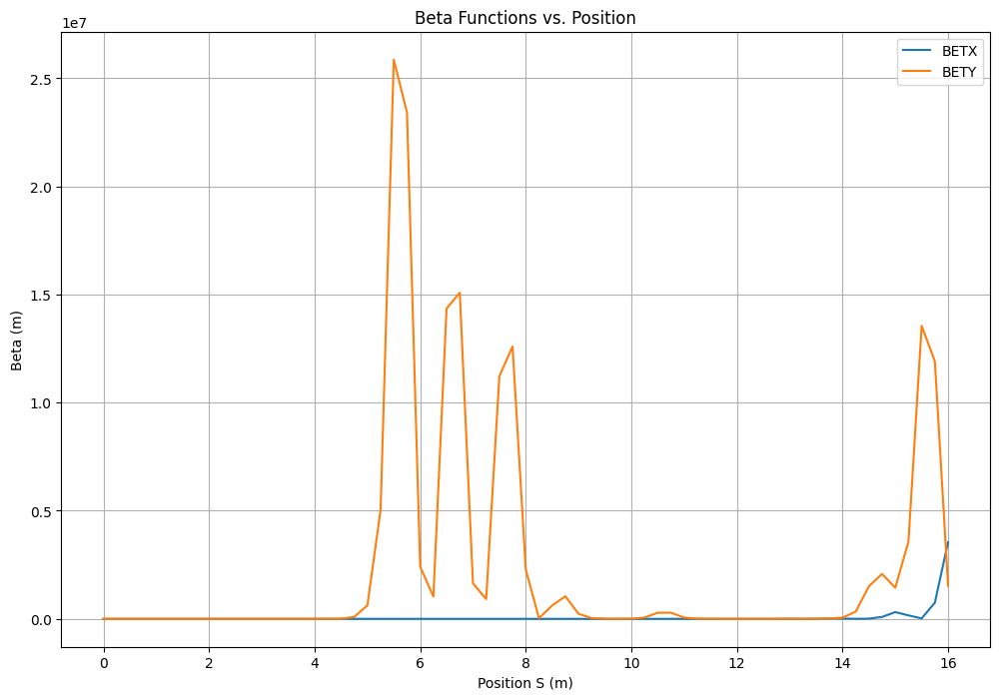

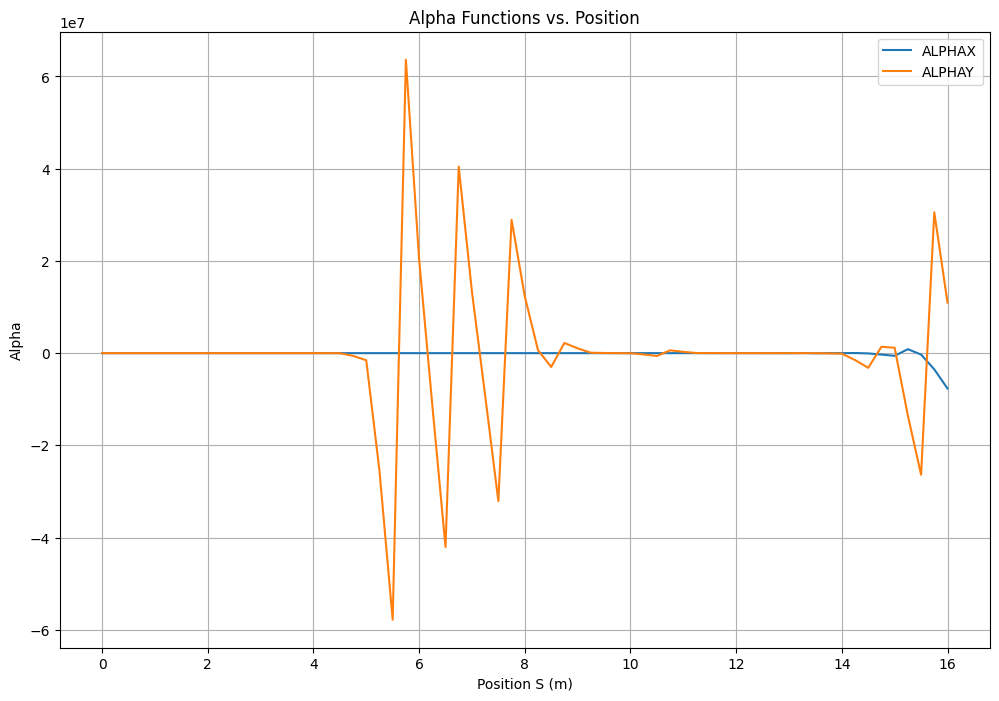

24
for length we are getting 0.25
MAD-X script generated and saved as test24.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:37:41      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test24.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=24, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-24, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=24, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-24, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=24, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-24, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=24, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

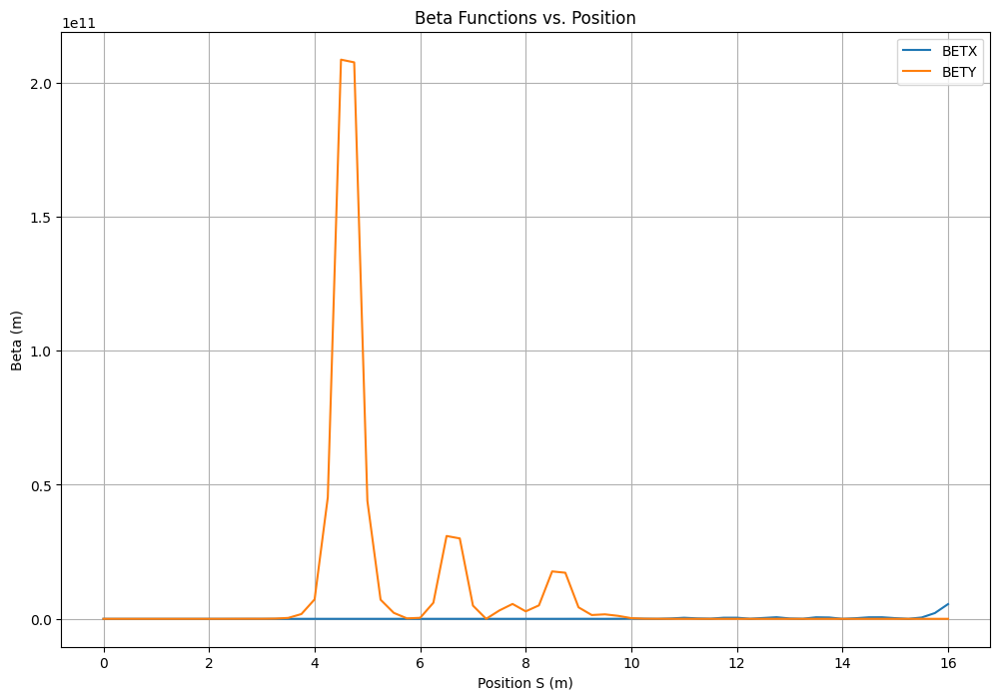

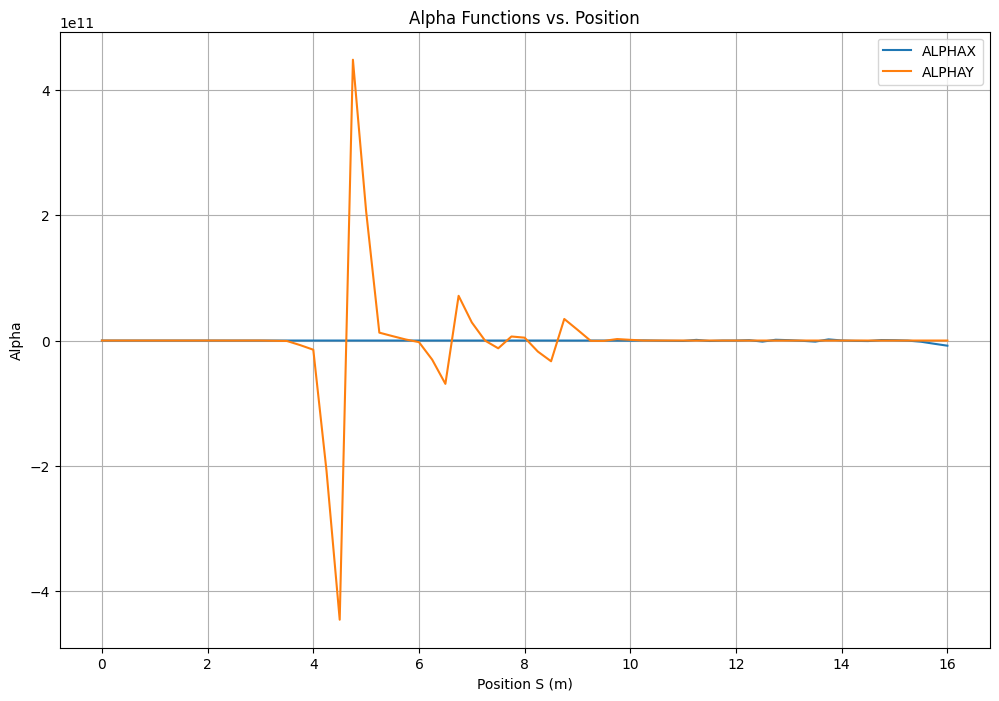

25
for length we are getting 0.25
MAD-X script generated and saved as test25.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:38:07      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test25.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=25, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-25, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=25, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-25, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=25, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-25, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=25, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

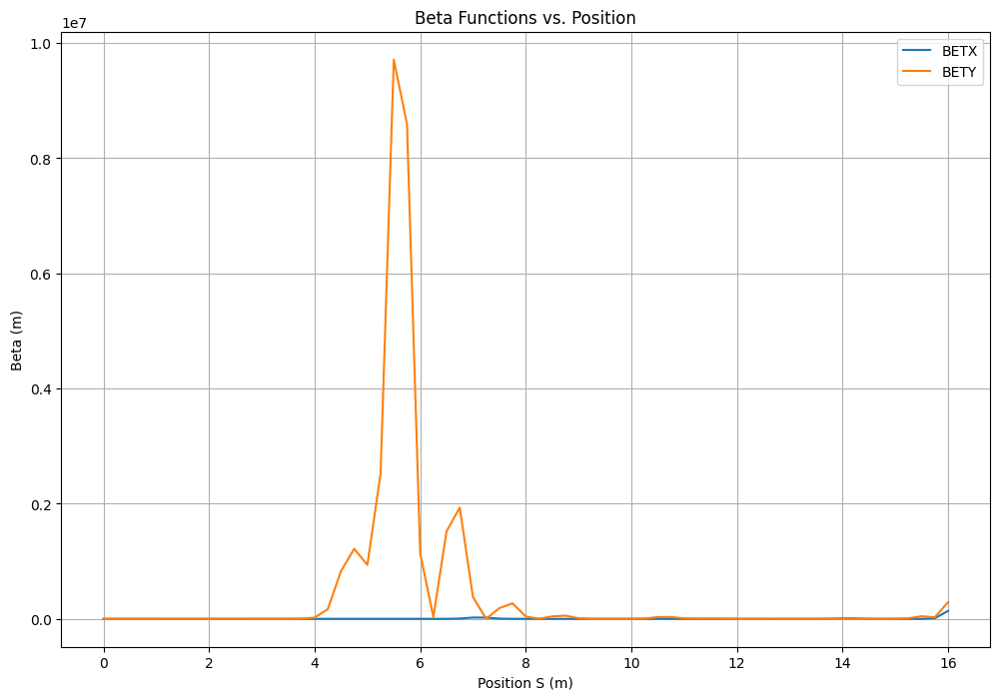

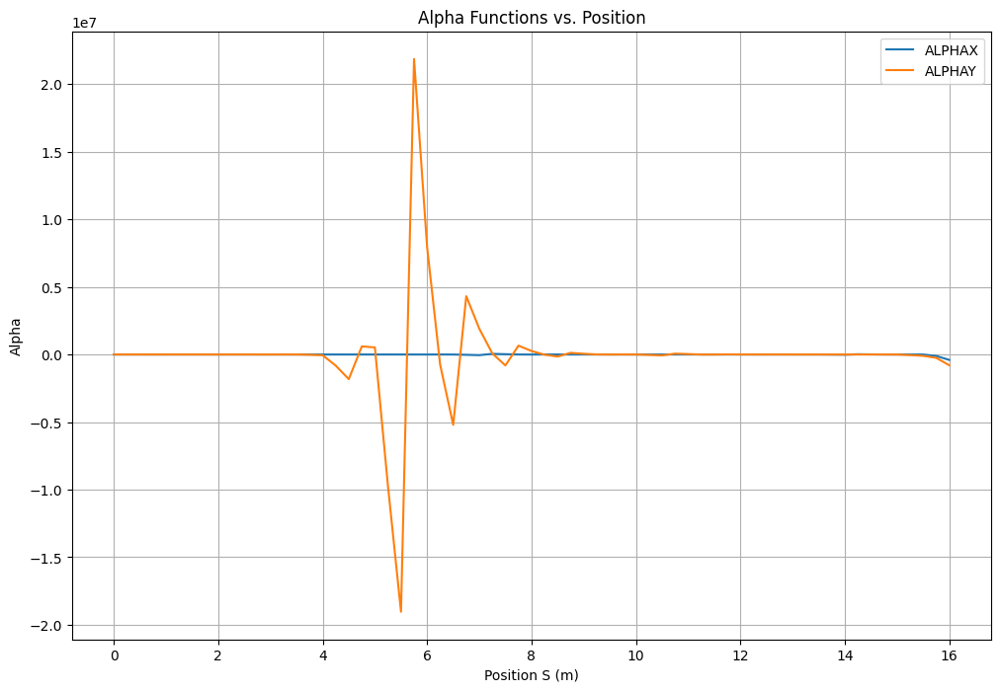

26
for length we are getting 0.25
MAD-X script generated and saved as test26.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:38:33      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test26.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=26, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-26, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=26, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-26, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=26, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-26, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=26, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

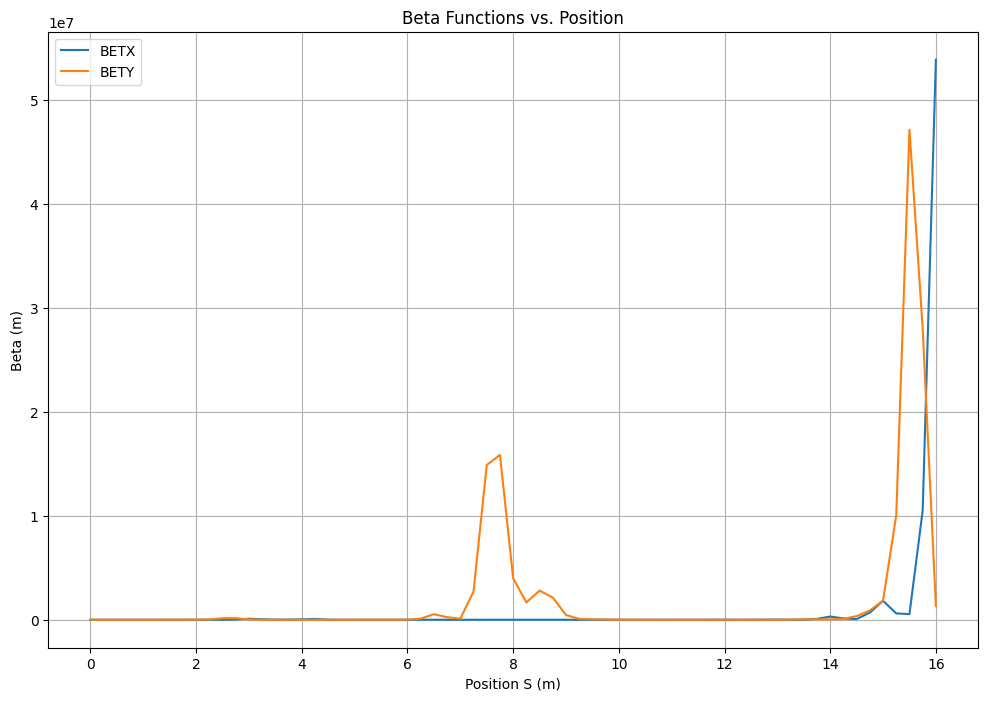

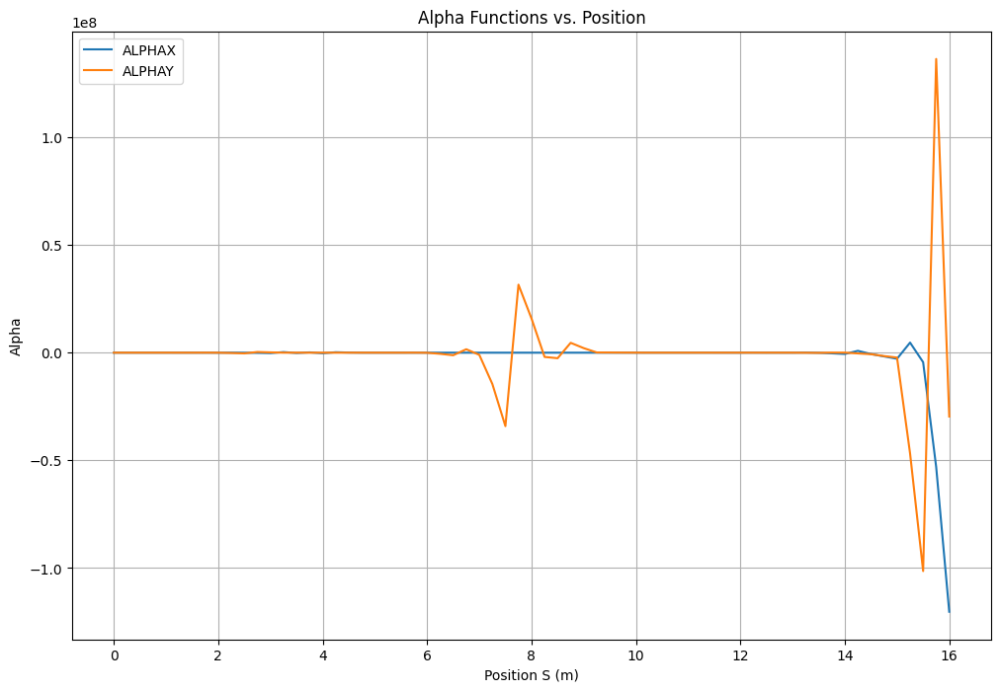

27
for length we are getting 0.25
MAD-X script generated and saved as test27.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:38:59      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test27.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=27, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-27, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=27, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-27, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=27, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-27, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=27, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

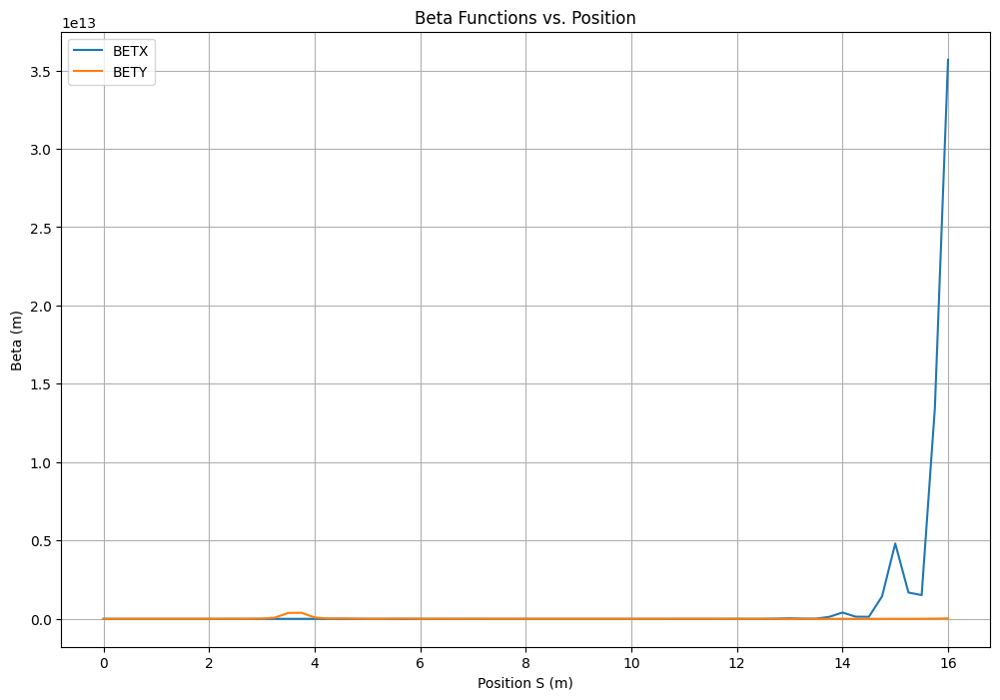

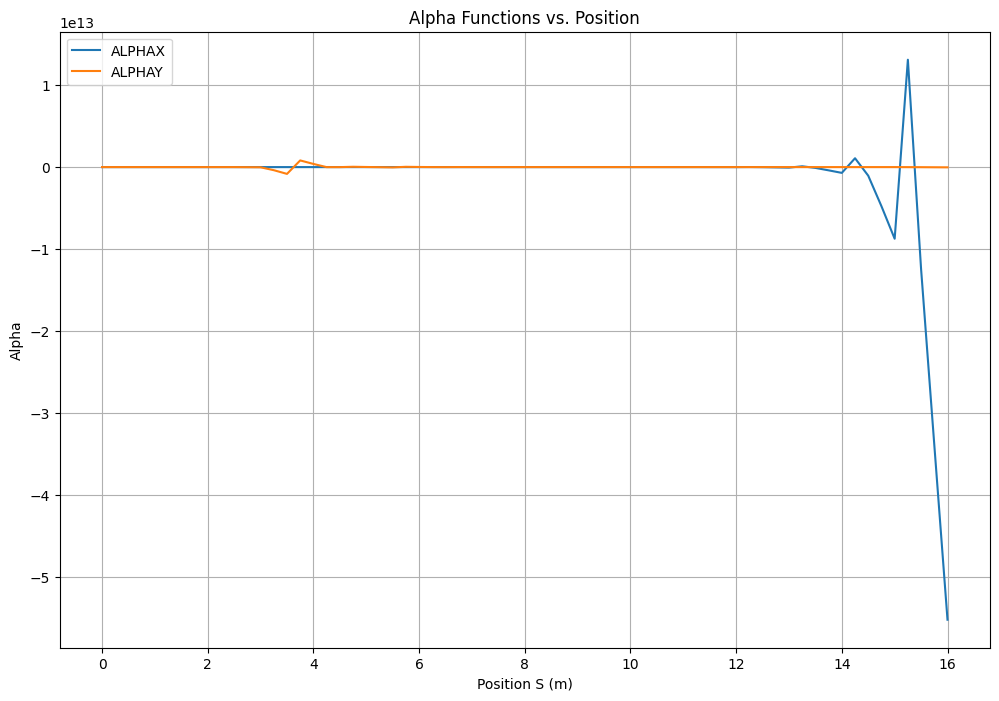

28
for length we are getting 0.25
MAD-X script generated and saved as test28.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:39:25      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test28.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=28, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-28, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=28, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-28, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=28, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-28, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=28, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

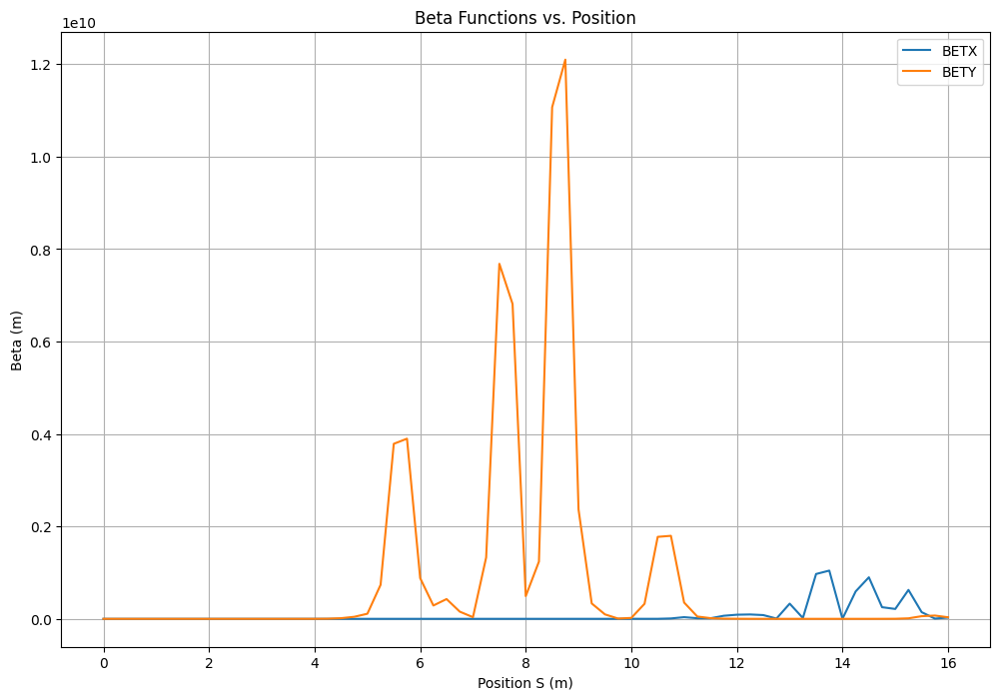

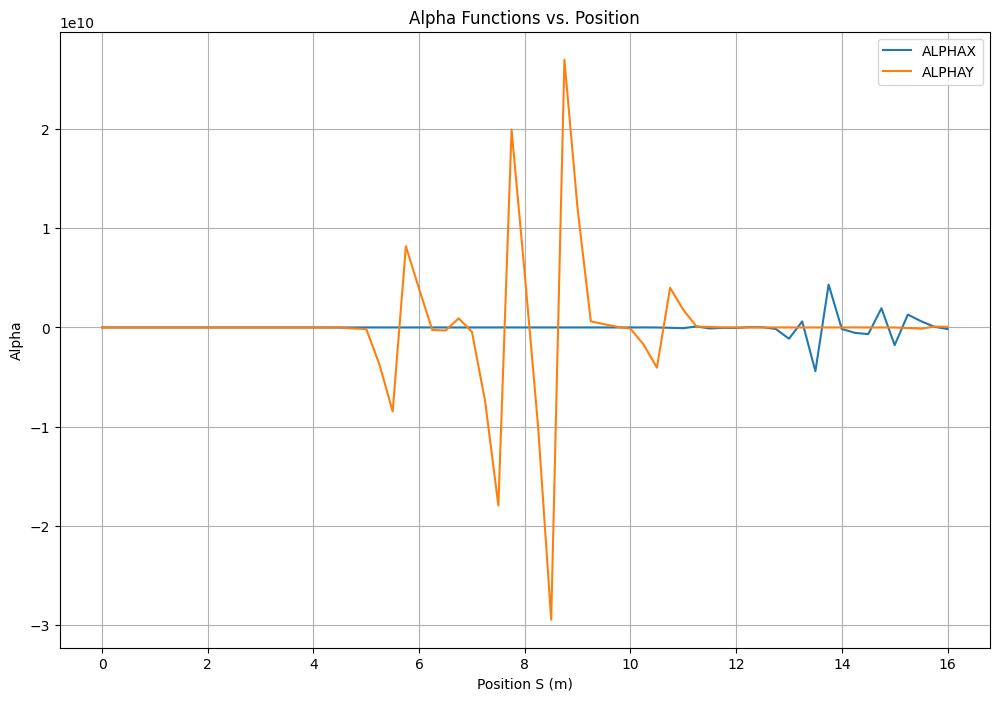

29
for length we are getting 0.25
MAD-X script generated and saved as test29.madx

  ++++++++++++++++++++++++++++++++++++++++++++
  +     MAD-X 5.09.01  (64 bit, Darwin)      +
  + Support: mad@cern.ch, http://cern.ch/mad +
  + Release   date: 2023.12.04               +
  + Execution date: 2024.07.09 21:39:51      +
  ++++++++++++++++++++++++++++++++++++++++++++


TITLE, 'test29.madx';



! Define sequence

FODO_SEQ: sequence, l=16;

    QF1: Quadrupole, K1=29, L=0.25, AT=0.125;

    D1: DRIFT, L=0.25, AT=0.375;

    QD1: Quadrupole, K1=-29, L=0.25, AT=0.625;

    D1b: DRIFT, L=0.25, AT=0.875;

    QF2: Quadrupole, K1=29, L=0.25, AT=1.125;

    D2: DRIFT, L=0.25, AT=1.375;

    QD2: Quadrupole, K1=-29, L=0.25, AT=1.625;

    D2b: DRIFT, L=0.25, AT=1.875;

    QF3: Quadrupole, K1=29, L=0.25, AT=2.125;

    D3: DRIFT, L=0.25, AT=2.375;

    QD3: Quadrupole, K1=-29, L=0.25, AT=2.625;

    D3b: DRIFT, L=0.25, AT=2.875;

    QF4: Quadrupole, K1=29, L=0.25, AT=3.125;

    D4: DRIFT, L=0.25, 

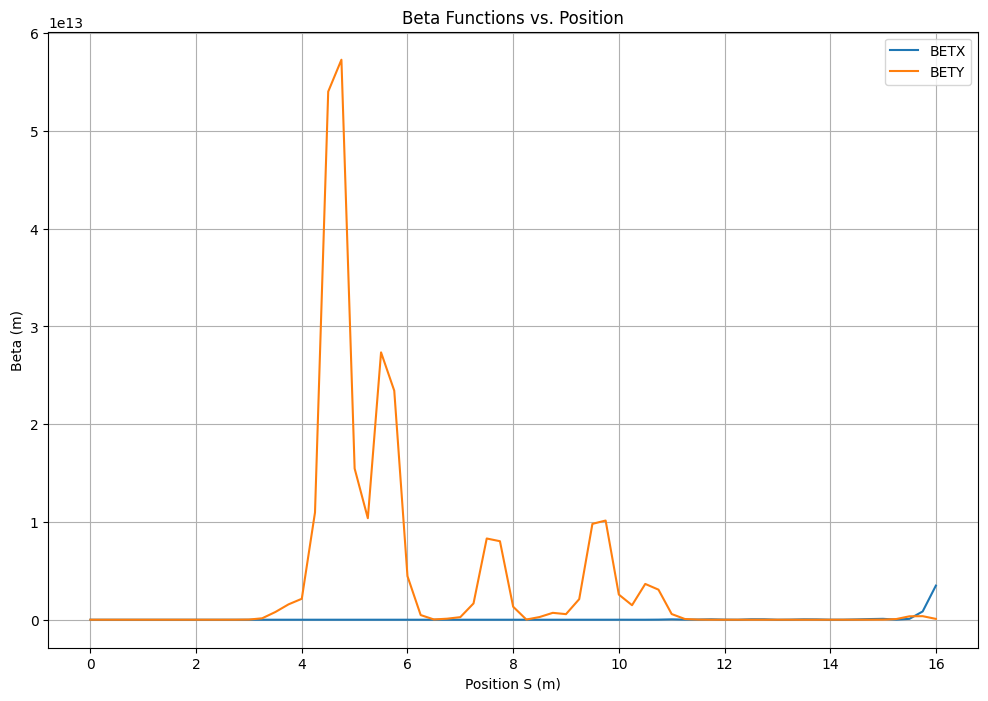

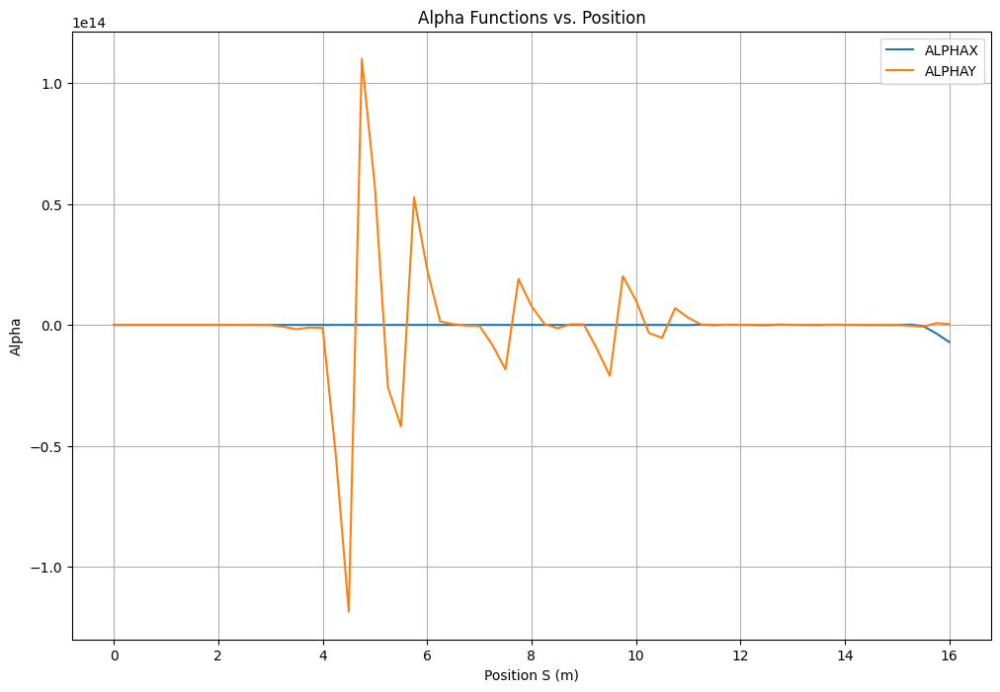

In [173]:
for i in range(2, 30):
    print(i)
    madxfilename = f"test{i}.madx"
    outputfilename = f"test_results{i}.tfs"
    num_fodo_cells = 16
    magnet_strengths = i
    length_of_magnets = 0.25
    initial_beta_x= 0.03
    initial_beta_y = 0.02
    constraints = [(0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02), (0.03, 0.02),]
   
    generate_madx_fodo_matching(num_fodo_cells, madxfilename, outputfilename, magnet_strengths, length_of_magnets, initial_beta_x, initial_beta_y, constraints)
    plot_twiss_parameters(madxfilename, outputfilename)
